In [1]:
%run DSLabsFunctions.ipynb

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
sns.set_style('darkgrid')
sns.set_palette("pastel")

# PULSAR CLASSIFICATION

HTRU2 is a data set which describes a sample of pulsar candidates collected during the High Time Resolution Universe Survey.
Each pulsar produces a slightly different emission pattern, which varies slightly with each rotation (see [2] for an introduction to pulsar astrophysics to find out why). Thus a potential signal detection known as a 'candidate', is averaged over many rotations of the pulsar, as determined by the length of an observation. In the absence of additional info, each candidate could potentially describe a real pulsar. However in practice almost all detections are caused by radio frequency interference (RFI) and noise, making legitimate signals hard to find.

Machine learning tools are now being used to automatically label pulsar candidates to facilitate rapid analysis. Classification systems in particular are being widely adopted (see [4,5,6,7,8,9]) which treat the candidate data sets  as binary classification problems.

    1. Mean of the integrated profile.
	2. Standard deviation of the integrated profile.
	3. Excess kurtosis of the integrated profile.
	4. Skewness of the integrated profile.
	5. Mean of the DM-SNR curve.
	6. Standard deviation of the DM-SNR curve.
	7. Excess kurtosis of the DM-SNR curve.
	8. Skewness of the DM-SNR curve.

HTRU 2 Summary: 17,898 total examples.

	1,639 positive examples.
	16,259 negative examples

In [9]:
df = pd.read_csv('HTRU_2.csv',header=None)

In [10]:
df

,0,1,2,3,4,5,6,7,8
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0
...,...,...,...,...,...,...,...,...,...
17893,136.429688,59.847421,-0.187846,-0.738123,1.296823,12.166062,15.450260,285.931022,0
17894,122.554688,49.485605,0.127978,0.323061,16.409699,44.626893,2.945244,8.297092,0
17895,119.335938,59.935939,0.159363,-0.743025,21.430602,58.872000,2.499517,4.595173,0
17896,114.507812,53.902400,0.201161,-0.024789,1.946488,13.381731,10.007967,134.238910,0


In [11]:
df.columns = ['Mean_IP','Std_IP','Exc_Kurtosis_IP', 'Skewness_IP','Mean_DMSNR','Std_DMSNR','Exc_Kurtosis_DMSNR','Skewness_DMSNR','pulsar']

In [12]:
df

,Mean_IP,Std_IP,Exc_Kurtosis_IP,Skewness_IP,Mean_DMSNR,Std_DMSNR,Exc_Kurtosis_DMSNR,Skewness_DMSNR,pulsar
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0
...,...,...,...,...,...,...,...,...,...
17893,136.429688,59.847421,-0.187846,-0.738123,1.296823,12.166062,15.450260,285.931022,0
17894,122.554688,49.485605,0.127978,0.323061,16.409699,44.626893,2.945244,8.297092,0
17895,119.335938,59.935939,0.159363,-0.743025,21.430602,58.872000,2.499517,4.595173,0
17896,114.507812,53.902400,0.201161,-0.024789,1.946488,13.381731,10.007967,134.238910,0


## Data Selection

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17898 entries, 0 to 17897
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Mean_IP             17898 non-null  float64
 1   Std_IP              17898 non-null  float64
 2   Exc_Kurtosis_IP     17898 non-null  float64
 3   Skewness_IP         17898 non-null  float64
 4   Mean_DMSNR          17898 non-null  float64
 5   Std_DMSNR           17898 non-null  float64
 6   Exc_Kurtosis_DMSNR  17898 non-null  float64
 7   Skewness_DMSNR      17898 non-null  float64
 8   pulsar              17898 non-null  int64  
dtypes: float64(8), int64(1)
memory usage: 1.2 MB


In [15]:
print(df.isnull().sum())

Mean_IP               0
Std_IP                0
Exc_Kurtosis_IP       0
Skewness_IP           0
Mean_DMSNR            0
Std_DMSNR             0
Exc_Kurtosis_DMSNR    0
Skewness_DMSNR        0
pulsar                0
dtype: int64


In [16]:
df.columns

Index(['Mean_IP', 'Std_IP', 'Exc_Kurtosis_IP', 'Skewness_IP', 'Mean_DMSNR',
       'Std_DMSNR', 'Exc_Kurtosis_DMSNR', 'Skewness_DMSNR', 'pulsar'],
      dtype='object')

In [17]:
print("Nr of records = ", len(df))
print("Dimensionality = ", df.shape)

Nr of records =  17898
Dimensionality =  (17898, 9)


### Class Distribution

In [19]:
(((df['pulsar'].value_counts())/17898)*100).round(1)

pulsar
0    90.8
1     9.2
Name: count, dtype: float64

pulsar
0    16259
1     1639
Name: count, dtype: int64


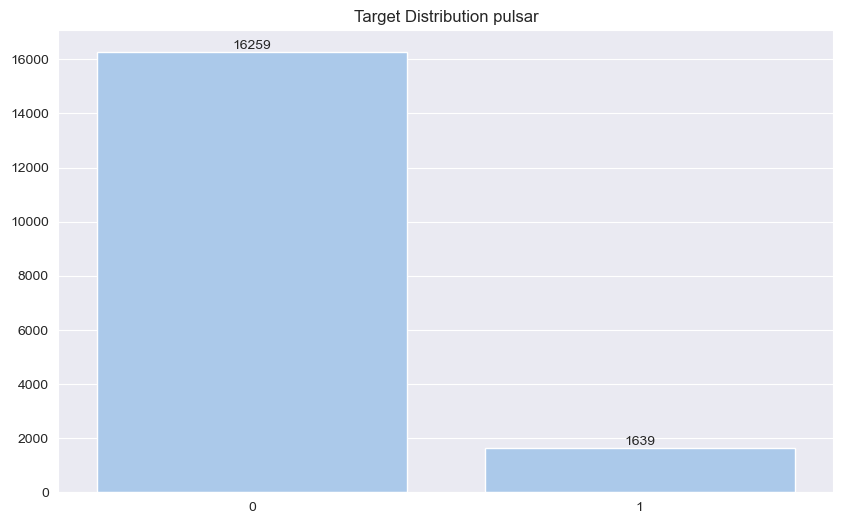

In [20]:
target = 'pulsar'

values = df[target].value_counts()
print(values)
plt.figure(figsize=(10,6))
ax = sns.barplot(x=values.index.to_list(),y=values.to_list())
ax.bar_label(ax.containers[0])
plt.title(f'Target Distribution {target}')
savefig(f"Plots/pulsar_class_distribution.png")

In [21]:
dict_balance = {0:((16259/17898)*100),1:((1639/17898)*100)}
print(dict_balance)

{0: 90.8425522404738, 1: 9.157447759526203}


### Dimensionality

- ratio between the number of features and the number of records:

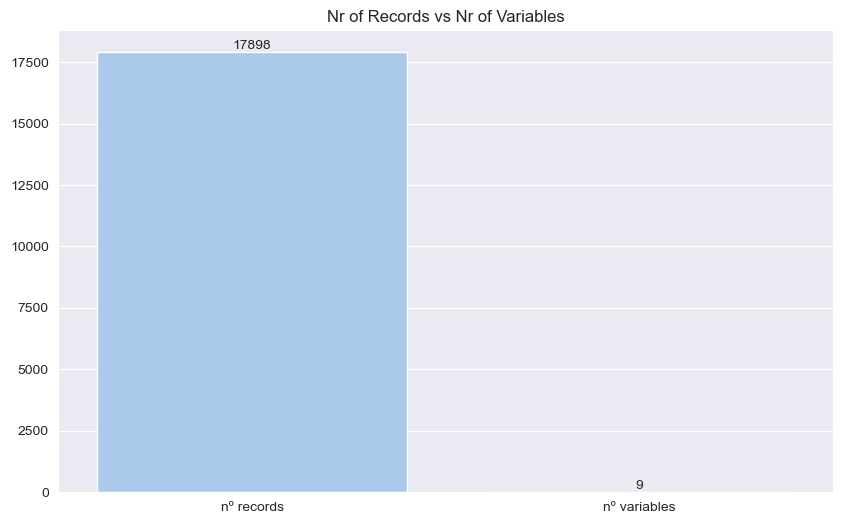

In [24]:
df_dict = {"nº records": len(df.index), "nº variables": len(df.columns)}

plt.figure(figsize=(10,6))
ax = sns.barplot(x=list(df_dict.keys()),y=list(df_dict.values()))
ax.bar_label(ax.containers[0])
plt.title('Nr of Records vs Nr of Variables')
savefig(f"Plots/pulsar_records_vs_variables.png")

In [25]:
def get_variables_types(dataframe):

    num_cols = []
    binary_cols = []
    cat_cols = []
    date_cols = []
    
    for column in df.columns:
        if df[column].dtypes =='int64':
            if (df[column]).nunique() == 2:
                binary_cols.append(column)
            else:
                num_cols.append(column)
        elif df[column].dtypes == 'float64':
            num_cols.append(column)
        elif df[column].dtypes == 'datetime64[ns]':
            date_cols.append(column)
        elif df[column].dtypes == 'object':
               if (df[column]).nunique() == 2:
                   binary_cols.append(column)
               else:
                   cat_cols.append(column)
        else:
            Pass

    return num_cols, binary_cols, cat_cols, date_cols

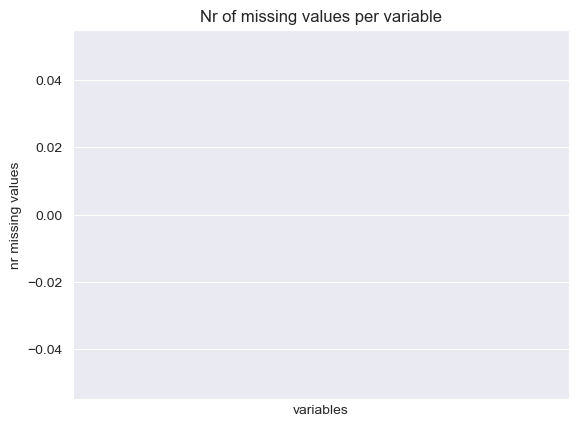

In [26]:
mv = {}
for var in df.columns:
    nr = df[var].isna().sum()
    if nr > 0:
        mv[var] = nr

plot_bar_chart(list(mv.keys()),list(mv.values()),title="Nr of missing values per variable",xlabel="variables",
    ylabel="nr missing values")
savefig(f"Plots/Pulsar_missing_values.png")

In [27]:
variable_types = get_variable_types(df.drop('pulsar',axis=1,inplace=False))
print(variable_types)

{'numeric': ['Mean_IP', 'Std_IP', 'Exc_Kurtosis_IP', 'Skewness_IP', 'Mean_DMSNR', 'Std_DMSNR', 'Exc_Kurtosis_DMSNR', 'Skewness_DMSNR'], 'binary': [], 'date': [], 'symbolic': []}


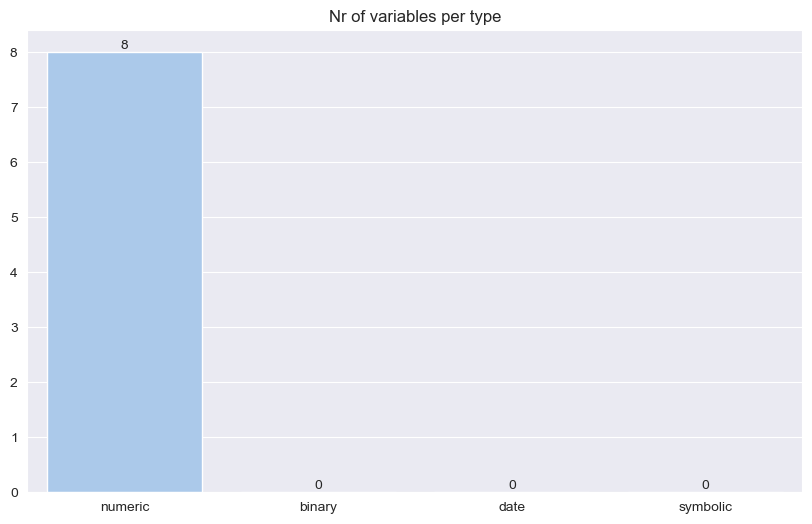

In [28]:
counts = {}
for tp in variable_types.keys():
    counts[tp] = len(variable_types[tp])

plt.figure(figsize=(10,6))
ax = sns.barplot(x=list(counts.keys()),y=list(counts.values()))
ax.bar_label(ax.containers[0])
plt.title('Nr of variables per type')
savefig(f"Plots/pulsar_n_variables_per_type.png")

### Data Distribution

In [30]:
summary5 = df.drop('pulsar', axis=1,inplace=False).describe().transpose()
summary5

,count,mean,std,min,25%,50%,75%,max
Mean_IP,17898.0,111.079968,25.652935,5.812500,100.929688,115.078125,127.085938,192.617188
Std_IP,17898.0,46.549532,6.843189,24.772042,42.376018,46.947479,51.023202,98.778911
Exc_Kurtosis_IP,17898.0,0.477857,1.064040,-1.876011,0.027098,0.223240,0.473325,8.069522
Skewness_IP,17898.0,1.770279,6.167913,-1.791886,-0.188572,0.198710,0.927783,68.101622
Mean_DMSNR,17898.0,12.614400,29.472897,0.213211,1.923077,2.801839,5.464256,223.392141
Std_DMSNR,17898.0,26.326515,19.470572,7.370432,14.437332,18.461316,28.428104,110.642211
Exc_Kurtosis_DMSNR,17898.0,8.303556,4.506092,-3.139270,5.781506,8.433515,10.702959,34.539844
Skewness_DMSNR,17898.0,104.857709,106.514540,-1.976976,34.960504,83.064556,139.309330,1191.000837


In [31]:
df.describe()['Mean_IP']['count']

17898.0

In [32]:
def var_describe_stat(dataframe):
    for feature in dataframe.columns:
        print(f"Summary for {feature} variable:")
        print("\tCount: ", dataframe.describe()[feature]["count"])
        print("\tMean: ", dataframe.describe()[feature]["mean"])
        print("\tStDev: ", dataframe.describe()[feature]["std"])
        print("\tMin: ", dataframe.describe()[feature]["min"])
        print("\tQ1: ", dataframe.describe()[feature]["25%"])
        print("\tMedian: ", dataframe.describe()[feature]["50%"])
        print("\tQ3: ", dataframe.describe()[feature]["75%"])
        print("\tMax: ", dataframe.describe()[feature]["max"])
        print("="*100)

In [33]:
var_describe_stat(df)

Summary for Mean_IP variable:
	Count:  17898.0
	Mean:  111.07996834492681
	StDev:  25.652935359860106
	Min:  5.8125
	Q1:  100.9296875
	Median:  115.078125
	Q3:  127.0859375
	Max:  192.6171875
Summary for Std_IP variable:
	Count:  17898.0
	Mean:  46.54953156153424
	StDev:  6.843189410087773
	Min:  24.77204176
	Q1:  42.376017585
	Median:  46.94747911
	Q3:  51.0232019925
	Max:  98.77891067
Summary for Exc_Kurtosis_IP variable:
	Count:  17898.0
	Mean:  0.47785725810191076
	StDev:  1.0640397163731572
	Min:  -1.876011181
	Q1:  0.02709812
	Median:  0.22324002399999998
	Q3:  0.4733251825
	Max:  8.069522046
Summary for Skewness_IP variable:
	Count:  17898.0
	Mean:  1.7702789980713487
	StDev:  6.167913247731734
	Min:  -1.791885981
	Q1:  -0.1885716535
	Median:  0.19871040099999998
	Q3:  0.9277830915
	Max:  68.10162173
Summary for Mean_DMSNR variable:
	Count:  17898.0
	Mean:  12.614399658311543
	StDev:  29.472897150065084
	Min:  0.213210702
	Q1:  1.923076923
	Median:  2.801839465
	Q3:  5.464255852

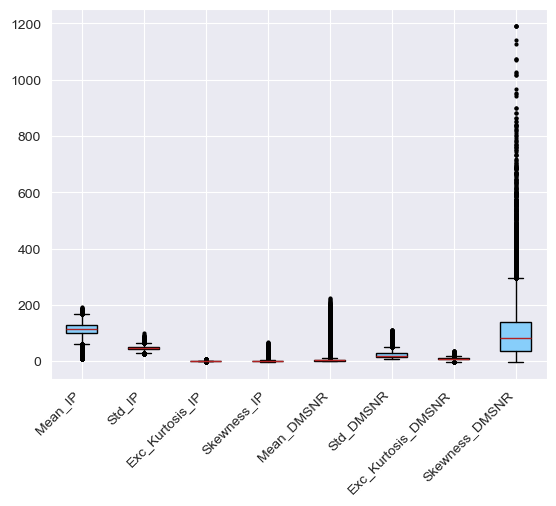

In [34]:
variables_types = get_variable_types(df)
numeric = variables_types["numeric"]
if [] != numeric:
    df[numeric].boxplot(rot=45,patch_artist = True,boxprops = dict(facecolor = "lightskyblue",edgecolor='black'),whiskerprops=dict(color='black'), medianprops = dict(color='firebrick'),flierprops={'marker': 'o', 'markersize': 2, 'markerfacecolor': 'black', 'markeredgecolor':'black'})
    plt.xticks(rotation=45, ha='right')
    savefig(f"Plots/Pulsar_global_boxplot.png", bbox_inches='tight')
else:
    print("There are no numeric variables.")

In [35]:
def boxplots(dataframe):
    variables_types = get_variable_types(df)
    numeric = variable_types["numeric"]

    if len(numeric) > 1:
        rows, cols = 2,4

        fig, axs = subplots(rows, cols, figsize=(cols * HEIGHT, rows * HEIGHT), squeeze=False)
        i, j = 0, 0
        for n in range(len(variables_types['numeric'])):
            axs[i, j].set_title("Boxplot for %s" % numeric[n])
            axs[i, j].boxplot(dataframe[numeric[n]].values,patch_artist = True,medianprops = dict(color='firebrick'),boxprops = dict(facecolor = "lightskyblue"),flierprops={'marker': 'o', 'markersize': 2, 'markerfacecolor': 'black', 'markeredgecolor':'black'})
            i, j = (i + 1, 0) if (n+1) % cols == 0 else (i, j+1)
        savefig("Plots/pulsar_single_boxplots.png")
    else:
        print("There are no numeric variables.")

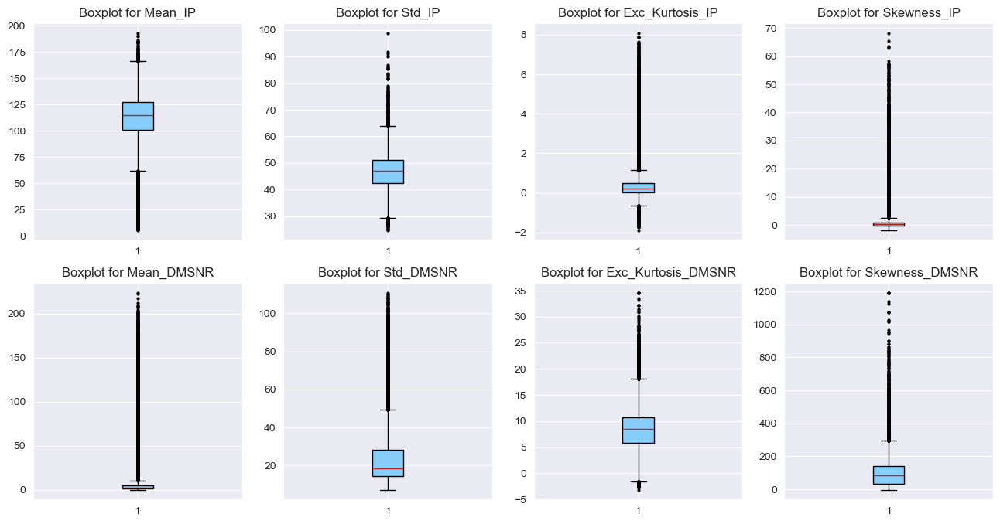

In [36]:
boxplots(df)

## Outliers

In [38]:
NR_STDEV: int = 2
IQR_FACTOR: float = 1.5
determine_outlier_thresholds_for_var(summary5, threshold = NR_STDEV)

(Mean_IP               162.385839
 Std_IP                 60.235910
 Exc_Kurtosis_IP         2.605937
 Skewness_IP            14.106105
 Mean_DMSNR             71.560194
 Std_DMSNR              65.267659
 Exc_Kurtosis_DMSNR     17.315740
 Skewness_DMSNR        317.886788
 dtype: float64,
 Mean_IP                59.774098
 Std_IP                 32.863153
 Exc_Kurtosis_IP        -1.650222
 Skewness_IP           -10.565547
 Mean_DMSNR            -46.331395
 Std_DMSNR             -12.614630
 Exc_Kurtosis_DMSNR     -0.708628
 Skewness_DMSNR       -108.171370
 dtype: float64)

In [39]:
outliers = count_outliers(df,variable_types["numeric"],NR_STDEV,IQR_FACTOR)
print(outliers)

{'iqr': [1030, 262, 1596, 1901, 2927, 2346, 487, 901], 'stdev': [1014, 815, 927, 711, 1047, 1434, 796, 755]}


In [40]:
len(outliers['iqr'])

8

In [41]:
len(outliers['stdev'])

8

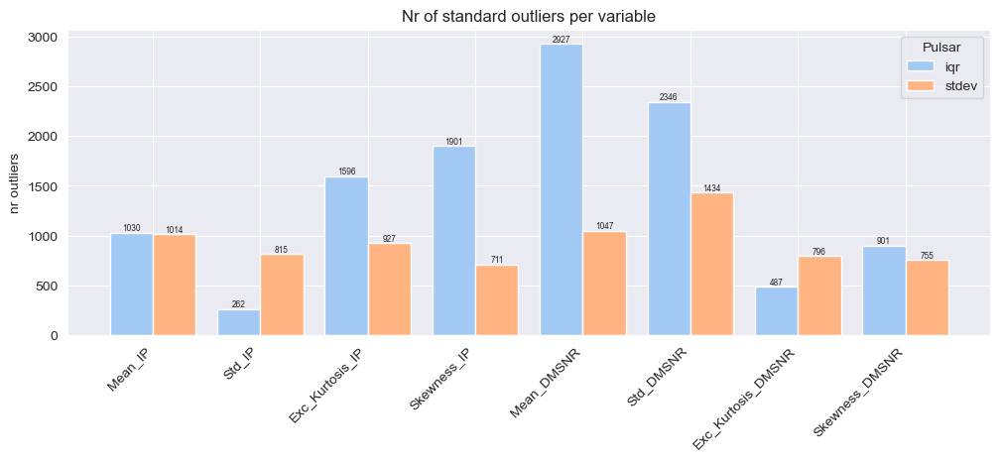

In [42]:
numeric = variable_types["numeric"]
if [] != numeric: 

    outliers
    plt.figure(figsize=(12, HEIGHT))
    plot_multibar_chart(numeric,outliers,
        #title="Nr of standard outliers per variable",
        #xlabel="variables",
        ylabel="nr outliers",
        percentage=False)
    plt.title("Nr of standard outliers per variable", fontsize=12)
    plt.legend(title='Pulsar',title_fontsize=10, loc='best',fontsize=10,markerscale=0.5)
    plt.xticks(rotation=45, ha='right')
    savefig('Plots/Pulsar outliers_standard.png',bbox_inches='tight')
else:
    print("There are no numeric variables.")

## Histograms

In [44]:
define_grid(len(numeric))

(3, 3)

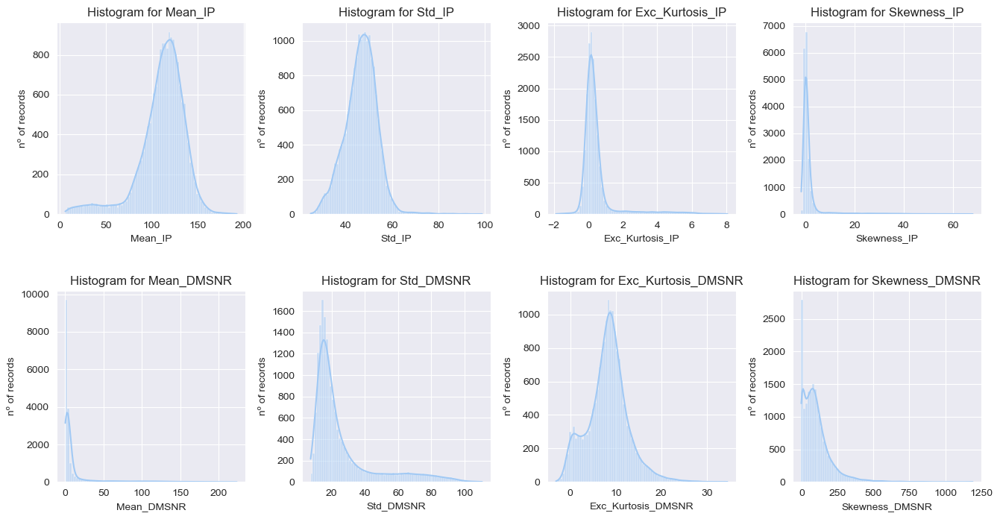

<Figure size 2000x1000 with 0 Axes>

In [45]:
if [] != numeric:
    rows, cols = 2,4
    fig, axs = subplots(rows, cols, figsize=(cols * HEIGHT, rows * HEIGHT), squeeze=False)
    plt.subplots_adjust(hspace=0.4, wspace=0.3)
    plt.figure(figsize=(20,10))
    i: int
    j: int
    i, j = 0, 0  
    for n in range(len(numeric)):
        
        axs[i, j]= sns.histplot(df[numeric[n]].dropna(), ax = axs[i,j], bins=80, kde=True)
        axs[i, j].set_title(f"Histogram for {numeric[n]}",fontsize=12)
        axs[i, j].set_xlabel(numeric[n], fontsize=10)
        axs[i, j].set_ylabel('nº of records', fontsize=10)
        i, j = (i + 1, 0) if (n + 1) % cols == 0 else (i, j + 1)
fig.savefig("Plots/Pulsar_single_histograms.png", bbox_inches = 'tight')

In [46]:
from numpy import log
from pandas import Series
from scipy.stats import norm, expon, lognorm

In [47]:
def compute_known_distributions(x_values):
    distributions = dict()
    # Gaussian
    mean, sigma = norm.fit(x_values)
    distributions["Normal(%.1f,%.2f)" % (mean, sigma)] = norm.pdf(x_values, mean, sigma)
    # Exponential
    loc, scale = expon.fit(x_values)
    distributions["Exp(%.2f)" % (1 / scale)] = expon.pdf(x_values, loc, scale)
    # LogNorm
    #sigma, loc, scale = lognorm.fit(x_values)
    #distributions["LogNor(%.1f,%.2f)" % (log(scale), sigma)] = lognorm.pdf(x_values, sigma, loc, scale)
    return distributions


def histogram_with_distributions(ax, series, var):
    values: list = series.sort_values().to_list()
    ax.hist(values, 20, density=True)
    distributions: dict = compute_known_distributions(values)
    plot_multiline_chart(values,distributions,ax=ax,title="Best fit for %s" % var,xlabel=var,ylabel="")

In [48]:
#if [] != numeric:
    #fig, axs = subplots(2, 4, figsize=(cols * HEIGHT, rows * HEIGHT), squeeze=False)
    #i, j = 0, 0
    #for n in range(len(numeric)):
        #histogram_with_distributions(axs[i, j], df[numeric[n]].dropna(), numeric[n])
        #i, j = (i + 1, 0) if (n + 1) % cols == 0 else (i, j + 1)
    #savefig("Plots/pulsar_histogram_numeric_distribution.png")
#else:
    #print("There are no numeric variables.")

### Sparsity

A dataset is said to be sparse when most of the space defined by its variables is not covered by the records in the dataset. 

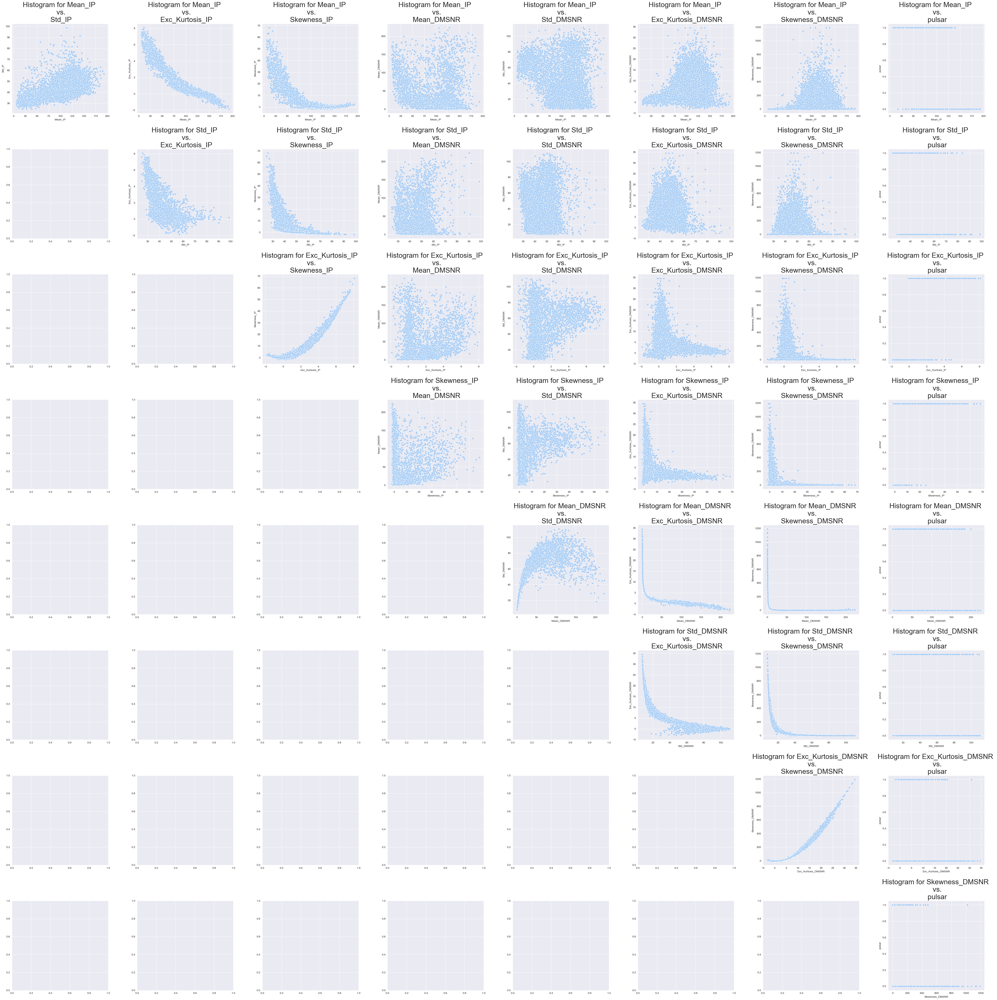

In [51]:
vars = df.columns.to_list()
if [] != vars:
    target = "pulsar"
    n = len(vars) - 1
    fig: Figure
    axs: ndarray
    fig, axs = subplots(n, n, figsize=(n * HEIGHT*2, n * HEIGHT*2), squeeze=True)
    plt.subplots_adjust(hspace=0.4, wspace=0.3)
    for i in range(len(vars)):
        var1 = vars[i]
        for j in range(i + 1, len(vars)):
            var2 = vars[j]
            axs[i, j - 1] = sns.scatterplot(data=df, x=var1, y=var2, ax = axs[i,j-1])
            axs[i, j - 1].set_title(f"Histogram for {var1} \n vs.\n {var2}",fontsize=26)
    savefig("Plots/pulsar_sparsity_study.png")
else:
    print("Sparsity class: there are no variables.")

. sparsity analysis per class:

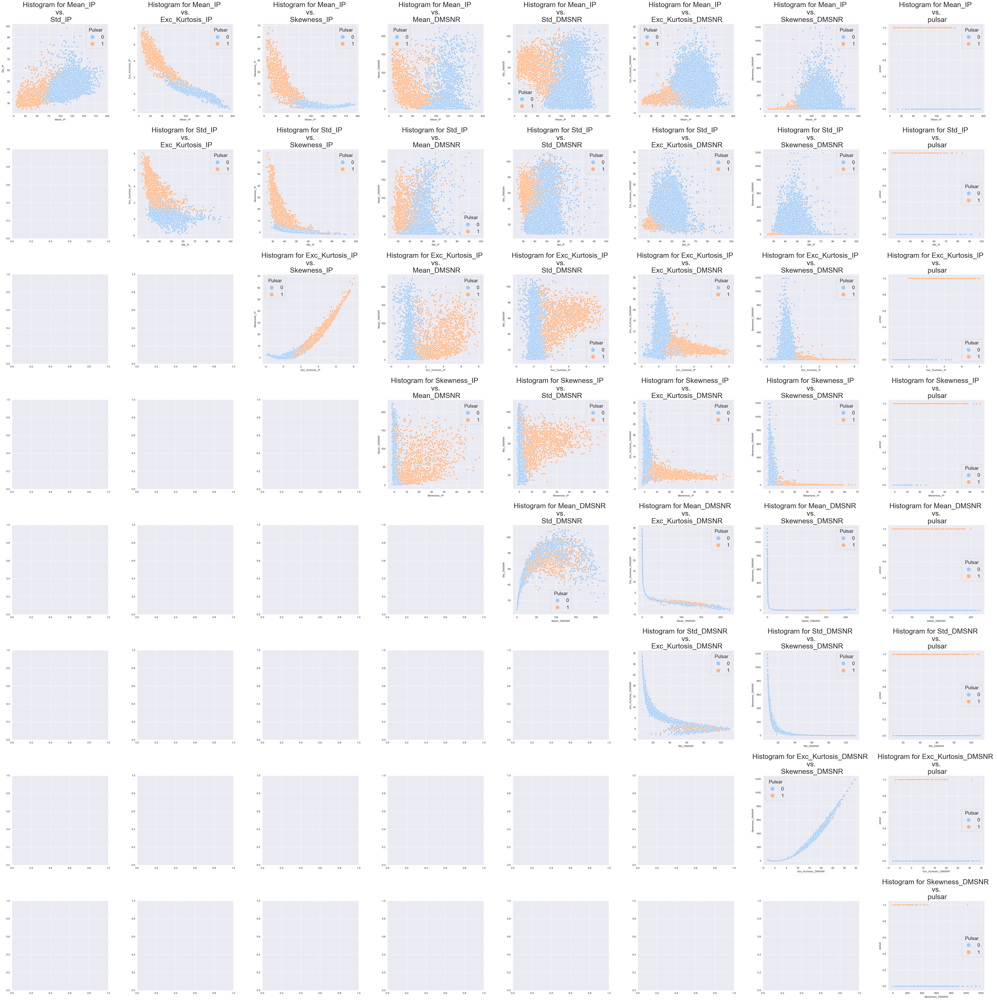

In [53]:
if [] != vars:
    target = "pulsar"

    n = len(vars) - 1
    fig, axs = subplots(n, n, figsize=(n * HEIGHT*2, n * HEIGHT*2), squeeze=True)
    plt.subplots_adjust(hspace=0.4, wspace=0.3)
    for i in range(len(vars)):
        var1: str = vars[i]
        for j in range(i + 1, len(vars)):
            var2: str = vars[j]
            axs[i, j - 1] = sns.scatterplot(data=df, x=var1, y=var2, hue='pulsar', ax = axs[i,j-1])
            axs[i, j - 1].set_title(f"Histogram for {var1} \n vs. \n {var2}",fontsize=26)
            axs[i, j - 1].legend(title='Pulsar',title_fontsize=18, loc='best',fontsize=18,markerscale=2.5)
    savefig("Plots/pulsar_sparsity_per_class_study.png")
else:
    print("Sparsity per class: there are no variables.")

## Correlation Analysis

In [55]:
df.select_dtypes(include=['float64','int64']).corr()

,Mean_IP,Std_IP,Exc_Kurtosis_IP,Skewness_IP,Mean_DMSNR,Std_DMSNR,Exc_Kurtosis_DMSNR,Skewness_DMSNR,pulsar
Mean_IP,1.000000,0.547137,-0.873898,-0.738775,-0.298841,-0.307016,0.234331,0.144033,-0.673181
Std_IP,0.547137,1.000000,-0.521435,-0.539793,0.006869,-0.047632,0.029429,0.027691,-0.363708
Exc_Kurtosis_IP,-0.873898,-0.521435,1.000000,0.945729,0.414368,0.432880,-0.341209,-0.214491,0.791591
Skewness_IP,-0.738775,-0.539793,0.945729,1.000000,0.412056,0.415140,-0.328843,-0.204782,0.709528
Mean_DMSNR,-0.298841,0.006869,0.414368,0.412056,1.000000,0.796555,-0.615971,-0.354269,0.400876
Std_DMSNR,-0.307016,-0.047632,0.432880,0.415140,0.796555,1.000000,-0.809786,-0.575800,0.491535
Exc_Kurtosis_DMSNR,0.234331,0.029429,-0.341209,-0.328843,-0.615971,-0.809786,1.000000,0.923743,-0.390816
Skewness_DMSNR,0.144033,0.027691,-0.214491,-0.204782,-0.354269,-0.575800,0.923743,1.000000,-0.259117
pulsar,-0.673181,-0.363708,0.791591,0.709528,0.400876,0.491535,-0.390816,-0.259117,1.000000


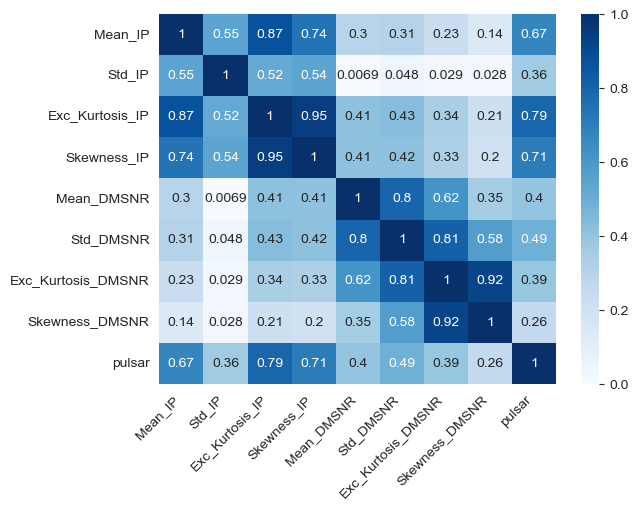

In [719]:
corr_mtx = df.corr().abs()

sns.heatmap(abs(corr_mtx),xticklabels=df.columns,yticklabels=df.columns,annot=True,cmap="Blues",vmin=0,vmax=1)
plt.xticks(rotation=45,ha='right')
savefig("Plots/pulsar_correlation_analysis.png",bbox_inches = 'tight')

## Scaling Preparation Task

### No Scaling: KNN and NB Analysis

In [59]:
from sklearn.model_selection import train_test_split

In [60]:
y = df['pulsar']
X = df.drop('pulsar', axis=1,inplace=False).values

In [61]:
print(X.shape)
print(y.shape)

if X.shape[0] != y.shape[0]:
  print("X and y rows are mismatched, check dataset again")

(17898, 8)
(17898,)


In [62]:
trnX, tstX, trnY, tstY = train_test_split(X, y, train_size=0.7, stratify=y)

In [63]:
train = concat([DataFrame(trnX, columns=df.drop('pulsar', axis=1,inplace=False).columns), DataFrame(trnY, columns=['pulsar'])], axis=1)
train.to_csv("Datasets/pulsar_train.csv", index=False)

test = concat([DataFrame(tstX, columns=df.drop('pulsar', axis=1,inplace=False).columns), DataFrame(tstY, columns=['pulsar'])], axis=1)
test.to_csv("Datasets/pulsar_test.csv", index=False)

In [64]:
value_counts_original = df['pulsar'].value_counts()
value_counts_test = test['pulsar'].value_counts()
value_counts_train = train['pulsar'].value_counts()

In [65]:
original_df = pd.DataFrame({'Class': value_counts_original.index, 'Count': value_counts_original.values})
test_df = pd.DataFrame({'Class': value_counts_test.index, 'Count': value_counts_test.values})
train_df = pd.DataFrame({'Class': value_counts_train.index, 'Count': value_counts_train.values})

In [66]:
original_df['Dataset'] = 'Original'
test_df['Dataset'] = 'Test'
train_df['Dataset'] = 'Train'
value_counts_sum = pd.concat([original_df,test_df,train_df])

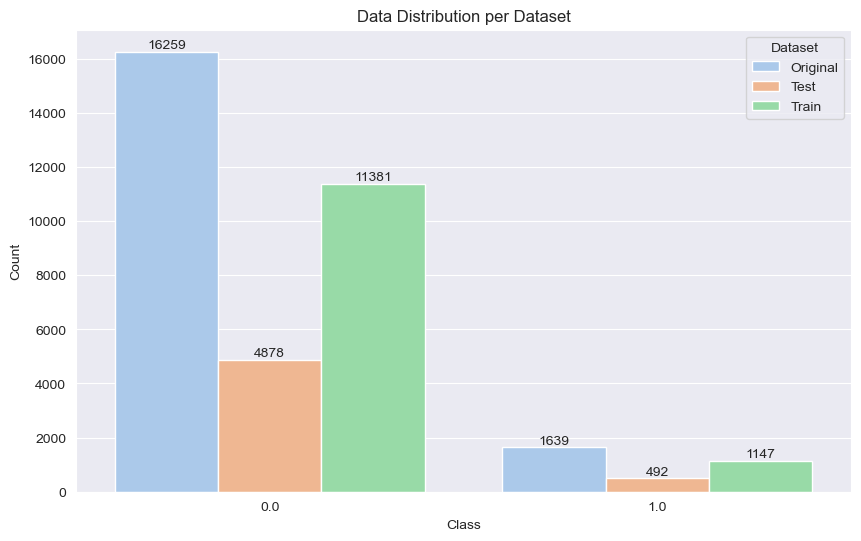

In [67]:
plt.figure(figsize=(10,6))
ax = sns.barplot(data=value_counts_sum,x='Class',y='Count',hue='Dataset')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
ax.bar_label(ax.containers[2])
plt.title('Data Distribution per Dataset')
savefig("Plots/pulsar_data_distribution_perdataset.png")

In [68]:
balance = {'0': [(16259/(16259+1639)*100), (4878/(4878+492)*100), (11381/(11381+1147)*100)], '1': [(1639/(1639+16259)*100), (492/(492+4878)*100), (1147/(1147+11381)*100)]}
balance_df = pd.DataFrame(data=balance, index=['Original','Test','Train'])
balance_df

,0,1
Original,90.842552,9.157448
Test,90.837989,9.162011
Train,90.844508,9.155492


#### NB

In [70]:
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB

In [71]:
def run_NB(trnX, trnY, tstX, tstY, metric: str = "recall"):
    estimators = {"GaussianNB": GaussianNB(),"BernoulliNB": BernoulliNB()}
    
    best_model: GaussianNB | MultinomialNB | BernoulliNB = None  # type: ignore
    best_performance: float = 0.0
    eval: dict[str, float] = {}

    for clf in estimators:
        estimators[clf].fit(trnX, trnY)
        prdY: ndarray = estimators[clf].predict(tstX)
        performance: float = CLASS_EVAL_METRICS[metric](tstY, prdY)
        if performance - best_performance > DELTA_IMPROVE:
            best_performance = performance
            best_model = estimators[clf]
    if best_model is not None:
        prd: ndarray = best_model.predict(tstX)
        for key in CLASS_EVAL_METRICS:
            eval[key] = CLASS_EVAL_METRICS[key](tstY, prd)
    return eval

In [72]:
run_NB(trnX, trnY, tstX, tstY, "recall") 

{'accuracy': 0.9409683426443203,
 'recall': 0.8536585365853658,
 'precision': 0.631578947368421,
 'auc': 0.9017165171651716,
 'f1': 0.7260155574762316}

In [73]:
def naive_Bayes_study(trnX, trnY, tstX, tstY, metric):
    estimators: dict = {"GaussianNB": GaussianNB(),"BernoulliNB": BernoulliNB()}

    xvalues: list = []
    yvalues: list = []
    best_model = None
    best_params: dict = {"name": "", "metric": metric, "params": ()}
    best_performance = 0
    for clf in estimators:
        xvalues.append(clf)
        estimators[clf].fit(trnX, trnY)
        prdY: array = estimators[clf].predict(tstX)
        eval: float = CLASS_EVAL_METRICS[metric](tstY, prdY)
        if eval - best_performance > DELTA_IMPROVE:
            best_performance: float = eval
            best_params["name"] = clf
            best_params[metric] = eval
            best_model = estimators[clf]
        yvalues.append(eval)
        # print(f'NB {clf}')

    plt.figure(figsize=(10,6))
    ax = sns.barplot(x=xvalues,y=yvalues)
    ax.bar_label(ax.containers[0])
    plt.title(f'Naive Bayes Models {(metric)}')
    ax.set(ylabel=f'{(metric)}')
  
    return best_model, best_params

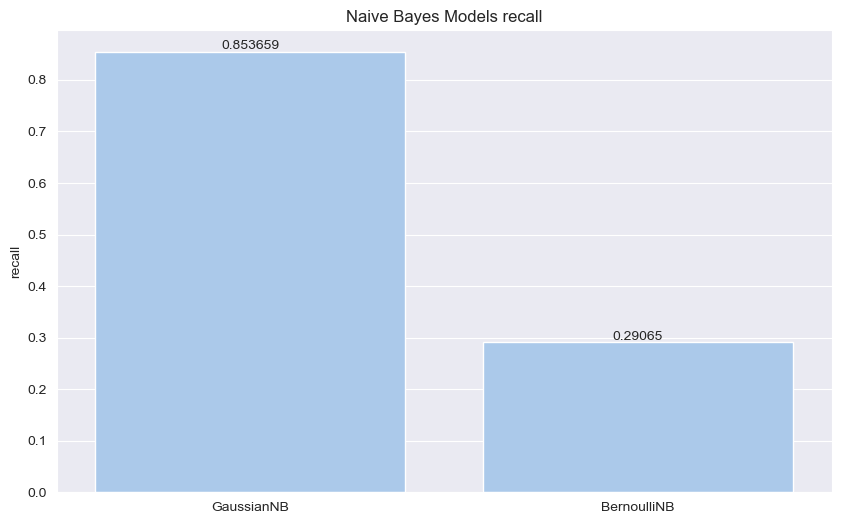

In [74]:
best_model_NB, params_NB = naive_Bayes_study(trnX, trnY, tstX, tstY, 'recall')

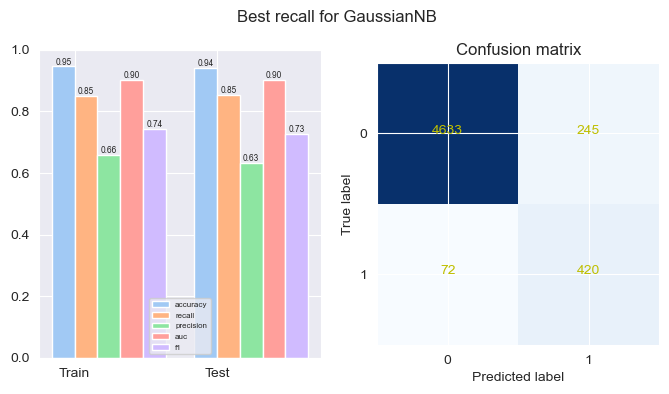

In [75]:
prd_trn_NB = best_model_NB.predict(trnX)
prd_tst_NB = best_model_NB.predict(tstX)

labels = [0,1]
plot_evaluation_results(params_NB, trnY, prd_trn_NB, tstY, prd_tst_NB, labels)
savefig(f"Plots/pulsar_{params_NB['name']}_best_{params_NB['metric']}_eval.png")

#### KNN

In [77]:
def knn_study(trnX, trnY, tstX, tstY, k_max, lag, metric): 
    dist = ['manhattan', 'euclidean', 'chebyshev']

    kvalues: list[int] = [i for i in range(1, k_max+1, lag)]
    best_model: KNeighborsClassifier | None = None
    best_params: dict = {'name': 'KNN', 'metric': metric, 'params': ()}
    best_performance: float = 0.0

    values: dict[str, list] = {}
    for d in dist:
        y_tst_values: list = []
        for k in kvalues:
            clf = KNeighborsClassifier(n_neighbors=k, metric=d)
            clf.fit(trnX, trnY)
            prdY: array = clf.predict(tstX)
            eval: float = CLASS_EVAL_METRICS[metric](tstY, prdY)
            y_tst_values.append(eval)
            if eval - best_performance > DELTA_IMPROVE:
                best_performance: float = eval
                best_params['params'] = (k, d)
                best_model = clf
            # print(f'KNN {d} k={k}')
        values[d] = y_tst_values
    
    print(f"KNN best with k={best_params['params'][0]} and {best_params['params'][1]}")
    plot_multiline_chart(kvalues, values, title=f'KNN Models {metric}', xlabel='k', ylabel=metric, percentage=True)
    

    return best_model, best_params

KNN best with k=1 and manhattan


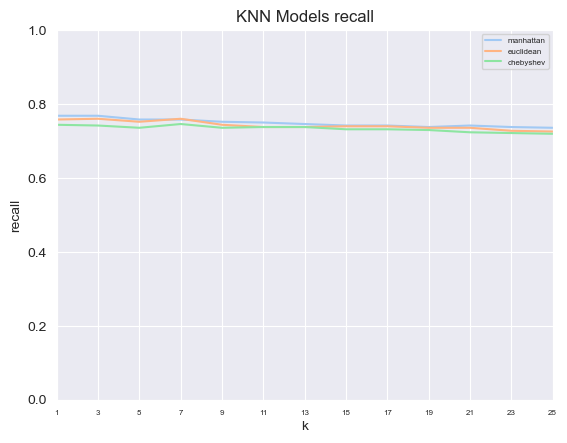

In [78]:
best_model_KNN, params_KNN = knn_study(trnX, trnY, tstX, tstY, 25, 2,'recall')

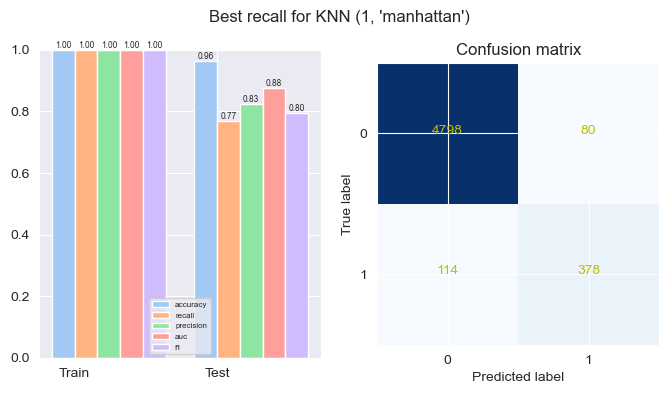

In [79]:
prd_trn_KNN = best_model_KNN.predict(trnX)
prd_tst_KNN = best_model_KNN.predict(tstX)

labels = [0,1]
plot_evaluation_results(params_KNN, trnY, prd_trn_KNN, tstY, prd_tst_KNN, labels)
savefig(f"Plots/pulsar_knn_{params_KNN['name']}_best_{params_KNN['metric']}_eval.png")

### Scaling: Zscore & MinMax

In [81]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

#### Zscore

normalize/standardize (i.e. μ = 0 and σ = 1) the features

In [84]:
StandardScaler = StandardScaler(with_mean=True, with_std=True, copy=True)

In [85]:
df_zscore = StandardScaler.fit_transform(df.drop('pulsar',axis=1,inplace=False))

In [86]:
df_zscore = pd.DataFrame(df_zscore, index=df.index)
df_zscore.columns = df.drop('pulsar',axis=1).columns
df_zscore['pulsar'] = df['pulsar']

In [87]:
df_zscore.to_csv('Datasets/pulsar_scaled_zscore.csv')

#### MinMax

In [89]:
MinMaxScaler = MinMaxScaler(feature_range=(0, 1), copy=True)

In [90]:
df_minmax = MinMaxScaler.fit_transform(df.drop('pulsar',axis=1))

In [91]:
df_minmax = pd.DataFrame(df_minmax, index=df.index)
df_minmax.columns = df.drop('pulsar',axis=1).columns
df_minmax['pulsar'] = df['pulsar']

In [92]:
df_minmax.to_csv('Datasets/pulsar_scaled_minmax.csv')

- zscore vs MinMax

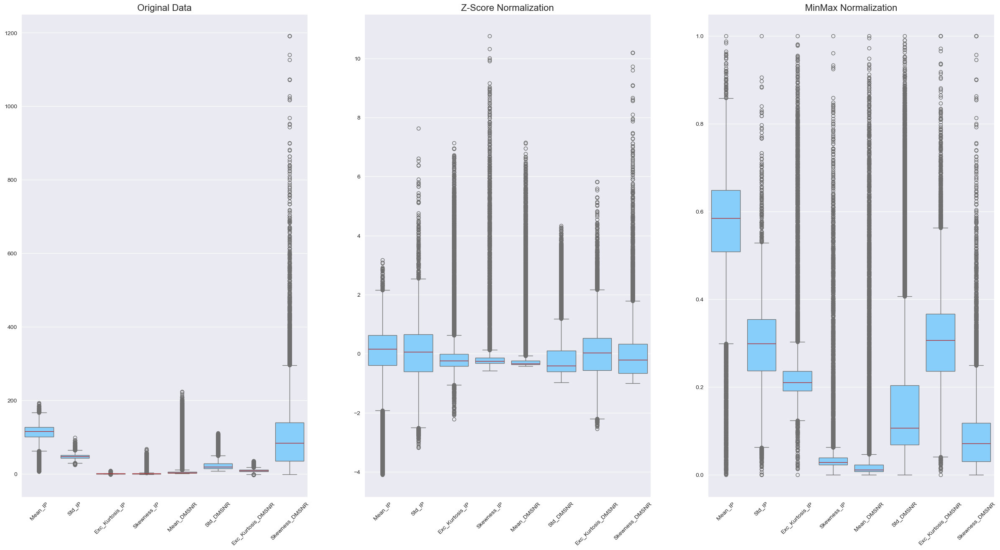

In [94]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(30, 15), squeeze=False)

ax1 = sns.boxplot(data= df.drop('pulsar',axis=1), patch_artist = True,medianprops = dict(color='firebrick'),boxprops = dict(facecolor = "lightskyblue"), ax=axes[0, 0])
ax1.set_title('Original Data', fontsize=16)
ax1.tick_params(axis='x', labelrotation=45)

ax2 = sns.boxplot(data = df_zscore.drop('pulsar',axis=1), ax=axes[0, 1], patch_artist = True,medianprops = dict(color='firebrick'),boxprops = dict(facecolor = "lightskyblue"))
ax2.set_title('Z-Score Normalization', fontsize=16)
ax2.tick_params(axis='x', labelrotation=45)

ax3 = sns.boxplot(data = df_minmax.drop('pulsar',axis=1), ax=axes[0, 2], patch_artist = True,medianprops = dict(color='firebrick'),boxprops = dict(facecolor = "lightskyblue"))
ax3.set_title("MinMax Normalization", fontsize=16)
ax3.tick_params(axis='x', labelrotation=45)

savefig("Plots/pulsar_zscore_minmax_outliers.png",bbox_inches = 'tight')

#### Zscore (NB & KNN)

##### NB

In [97]:
y_zscore = df_zscore['pulsar'].values
X_zscore = df_zscore.drop('pulsar', axis=1,inplace=False).values

In [98]:
trnX_zscore, tstX_zscore, trnY_zscore, tstY_zscore= train_test_split(X_zscore ,y_zscore , train_size=0.7, stratify=y)

In [99]:
run_NB(trnX_zscore, trnY_zscore, tstX_zscore, tstY_zscore, "recall") 

{'accuracy': 0.9541899441340782,
 'recall': 0.8882113821138211,
 'precision': 0.695859872611465,
 'auc': 0.9245279952799528,
 'f1': 0.7803571428571429}

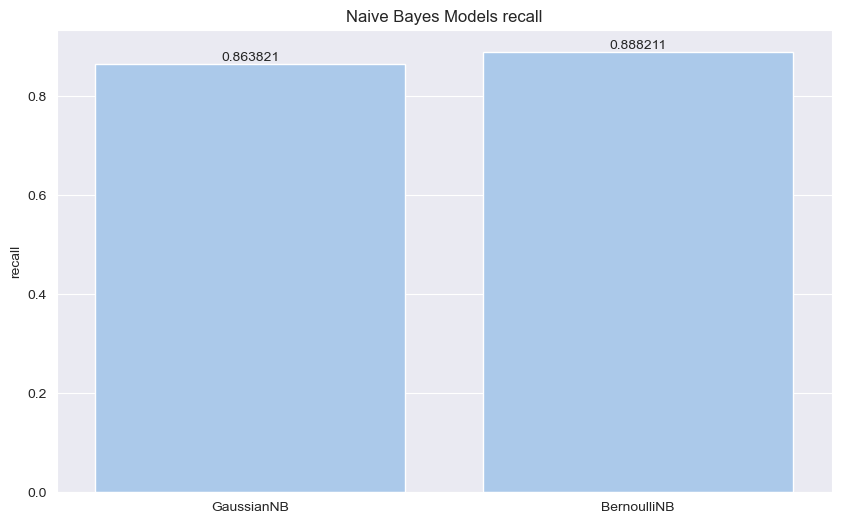

In [100]:
best_model_NB_zscore, params_NB_zscore = naive_Bayes_study(trnX_zscore, trnY_zscore, tstX_zscore, tstY_zscore, 'recall')

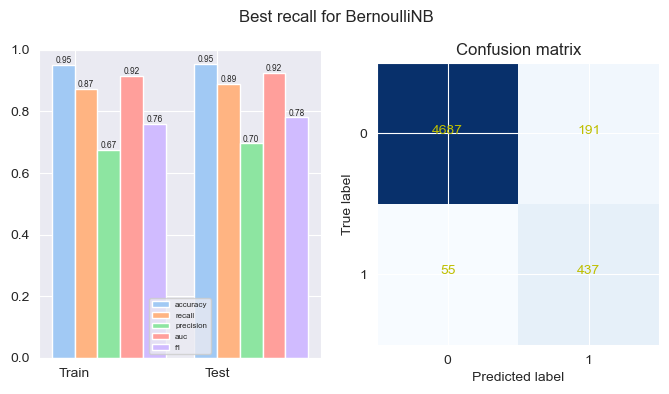

In [101]:
prd_trn_NB_zscore = best_model_NB_zscore.predict(trnX_zscore)
prd_tst_NB_zscore = best_model_NB_zscore.predict(tstX_zscore)

labels = [0,1]
plot_evaluation_results(params_NB_zscore, trnY_zscore, prd_trn_NB_zscore, tstY_zscore, prd_tst_NB_zscore, labels)

savefig(f"Plots/pulsar_{params_NB_zscore['name']}_best_{params_NB_zscore['metric']}_eval_zscore.png")

##### KNN

KNN best with k=3 and chebyshev


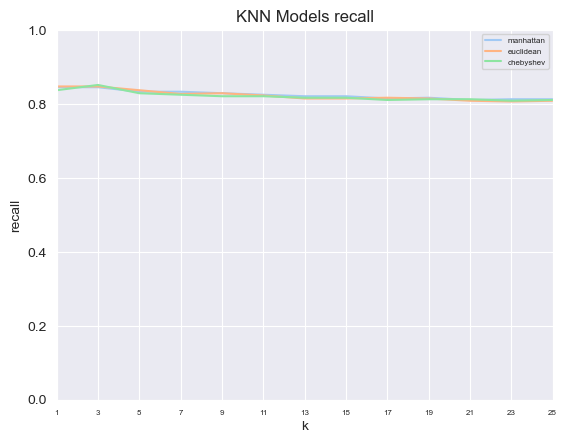

In [103]:
best_model_KNN_zscore, params_KNN_zscore = knn_study(trnX_zscore, trnY_zscore, tstX_zscore, tstY_zscore, 25, 2,'recall')

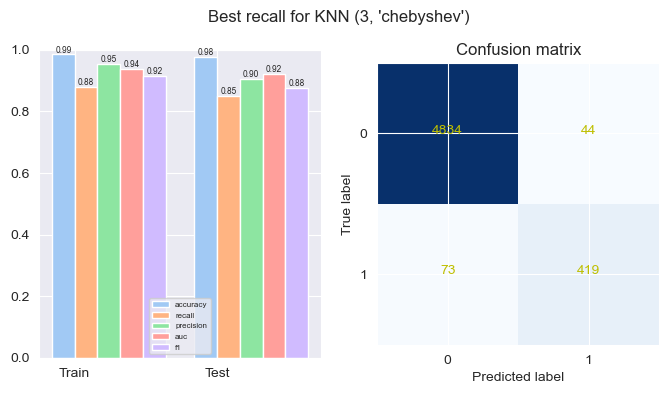

In [104]:
prd_trn_KNN_zscore = best_model_KNN_zscore.predict(trnX_zscore)
prd_tst_KNN_zscore = best_model_KNN_zscore.predict(tstX_zscore)

labels = [0,1]
plot_evaluation_results(params_KNN_zscore, trnY_zscore, prd_trn_KNN_zscore, tstY_zscore, prd_tst_KNN_zscore, labels)
savefig(f"Plots/pulsar_knn_{params_KNN_zscore['name']}_best_{params_KNN_zscore['metric']}_eval_zscore.png")

#### MinMax (NB & KNN)

In [106]:
y_minmax = df_minmax['pulsar'].values
X_minmax = df_minmax.drop('pulsar', axis=1,inplace=False).values

In [107]:
trnX_minmax, tstX_minmax, trnY_minmax, tstY_minmax = train_test_split(X_minmax,y_minmax, train_size=0.7, stratify=y)

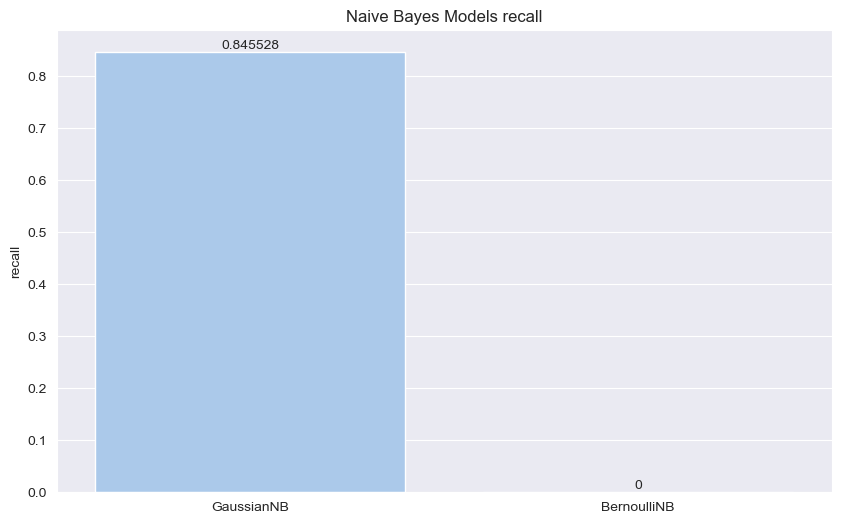

In [108]:
best_model_NB_minmax, params_NB_minmax = naive_Bayes_study(trnX_minmax, trnY_minmax, tstX_minmax, tstY_minmax, 'recall')

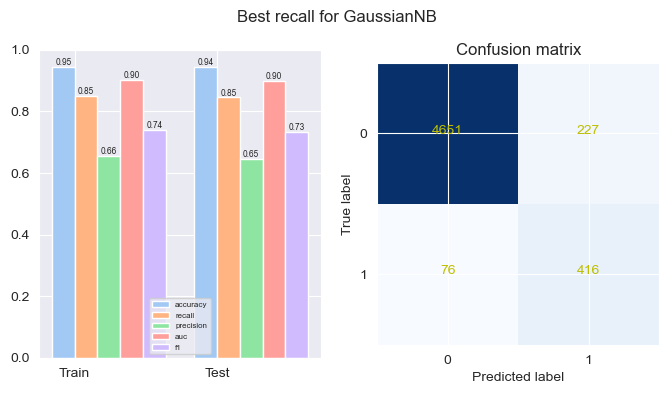

In [109]:
prd_trn_NB_minmax = best_model_NB_minmax.predict(trnX_minmax)
prd_tst_NB_minmax = best_model_NB_minmax.predict(tstX_minmax)

labels = [0,1]
plot_evaluation_results(params_NB_minmax, trnY_minmax, prd_trn_NB_minmax, tstY_minmax, prd_tst_NB_minmax, labels)
savefig(f"Plots/pulsar_{params_NB_minmax['name']}_best_{params_NB_minmax['metric']}_eval_minmax.png")

##### KNN

KNN best with k=1 and chebyshev


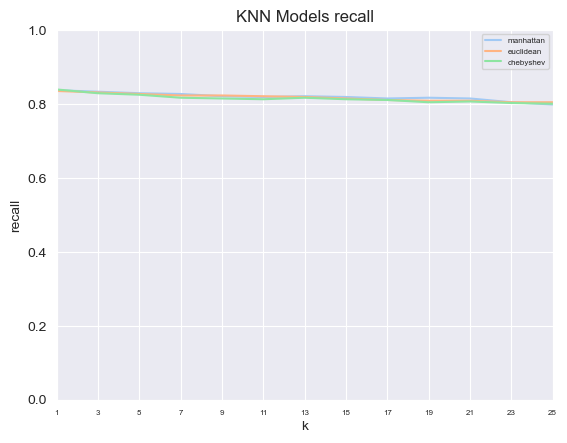

In [111]:
best_model_KNN_minmax, params_KNN_minmax = knn_study(trnX_minmax, trnY_minmax, tstX_minmax, tstY_minmax, 25, 2,'recall')

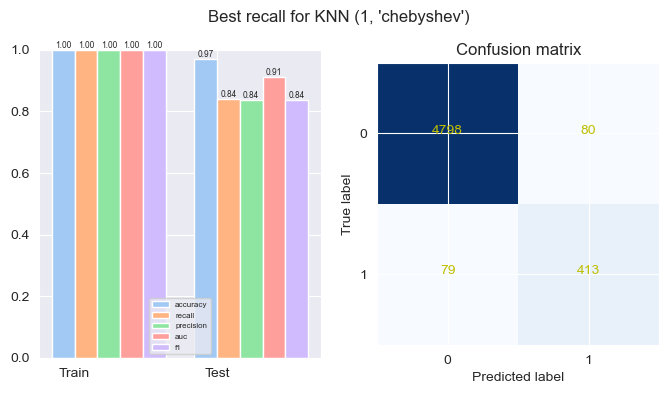

In [112]:
prd_trn_KNN_minmax = best_model_KNN_minmax.predict(trnX_minmax)
prd_tst_KNN_minmax = best_model_KNN_minmax.predict(tstX_minmax)

labels = [0,1]
plot_evaluation_results(params_KNN_minmax, trnY_minmax, prd_trn_KNN_minmax, tstY_minmax, prd_tst_KNN_minmax, labels)
savefig(f"Plots/pulsar_knn_{params_KNN_minmax['name']}_best_{params_KNN_minmax['metric']}_eval_minmax.png")

### Dataset choice

***Best Result Dataset:***

**No Scaling:**

    - KNN Result 1
    - NB Result 1

**Scaling:**

    - Zscore:
        - KNN Result 2
        - NB Result 2
        
    - MinMax:
        - KNN Result 3
        - NB Result 3

---

**From KNN Results**: KNN Zscore Result
**From NB Results**: NB Zscore Result

***

**The best result:** NB Zscore

## Balancing Preparation Task

Data balancing must be only applied over the training data, in a manner that the test data set doesn’t suffer any transformation on the original data distribution. In this manner, the train-test splitting must be done before data balancing.

In [117]:
train_zscore = concat([DataFrame(trnX_zscore, columns=df.drop('pulsar', axis=1,inplace=False).columns), DataFrame(trnY_zscore, columns=['pulsar'])], axis=1)
train_zscore.to_csv("Datasets/pulsar_train_zscore.csv", index=False)

test_zscore = concat([DataFrame(tstX_zscore, columns=df.drop('pulsar', axis=1,inplace=False).columns), DataFrame(tstY_zscore, columns=['pulsar'])], axis=1)
test_zscore.to_csv("Datasets/pulsar_test_zscore.csv", index=False)

In [118]:
df_positives = train_zscore[train_zscore['pulsar'] == 1]
df_negatives = train_zscore[train_zscore['pulsar'] == 0]

In [119]:
df_positives.shape

(1147, 9)

In [120]:
df_negatives.shape

(11381, 9)

### Oversampling

In [122]:
df_pos_sample = DataFrame(df_positives.sample(len(df_negatives), replace=True))
df_over = concat([df_pos_sample, df_negatives], axis=0)
df_over.to_csv("Datasets/pulsar_oversampling.csv")

print("Minority class=", 1, ":", len(df_pos_sample))
print("Majority class=", 0, ":", len(df_negatives))
print("Proportion:", round(len(df_pos_sample) / len(df_negatives), 2), ": 1")

Minority class= 1 : 11381
Majority class= 0 : 11381
Proportion: 1.0 : 1


In [123]:
trnY_over = df_over['pulsar'].values
trnX_over = df_over.drop('pulsar', axis=1).values
tstY_over = tstY_zscore
tstX_over = tstX_zscore

In [124]:
print(trnX_over.shape)
print(trnY_over.shape)

if (trnX_over.shape[0] != trnY_over.shape[0]):
  print("X and y rows are mismatched, check dataset again")

(22762, 8)
(22762,)


#### NB

In [126]:
run_NB(trnX_over, trnY_over, tstX_over, tstY_over, "recall") 

{'accuracy': 0.9333333333333333,
 'recall': 0.9166666666666666,
 'precision': 0.5872395833333334,
 'auc': 0.925840508405084,
 'f1': 0.715873015873016}

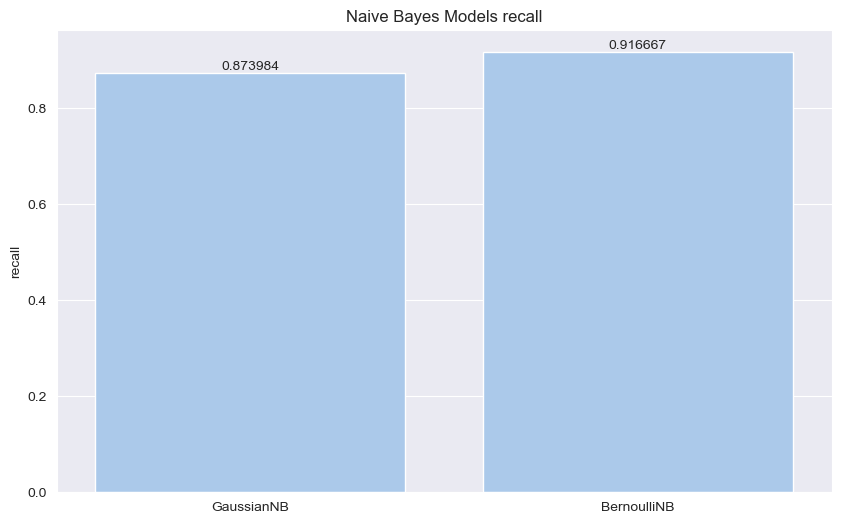

In [127]:
best_model_NB_over, params_NB_over = naive_Bayes_study(trnX_over, trnY_over, tstX_over, tstY_over, 'recall')

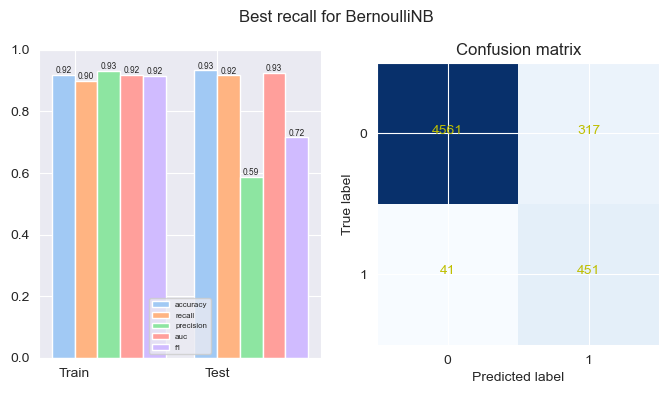

In [128]:
prd_trn_NB_over = best_model_NB_over.predict(trnX_over)
prd_tst_NB_over = best_model_NB_over.predict(tstX_over)

labels = [0,1]
plot_evaluation_results(params_NB_over, trnY_over, prd_trn_NB_over, tstY_over, prd_tst_NB_over, labels)
savefig(f"Plots/pulsar_{params_NB_over['name']}_best_{params_NB_over['metric']}_eval_oversampling.png")

#### KNN

KNN best with k=13 and euclidean


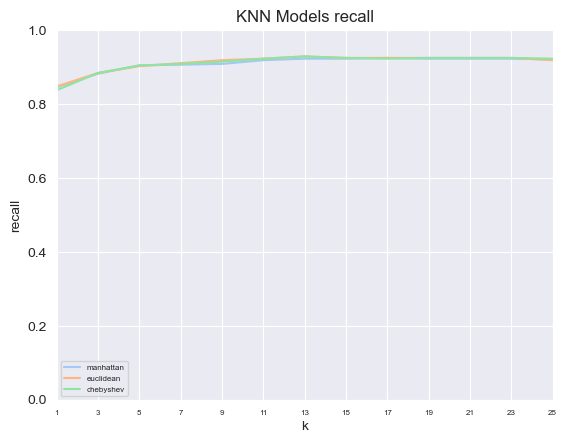

In [130]:
best_model_KNN_over, params_KNN_over = knn_study(trnX_over, trnY_over, tstX_over, tstY_over, 25, 2,'recall')

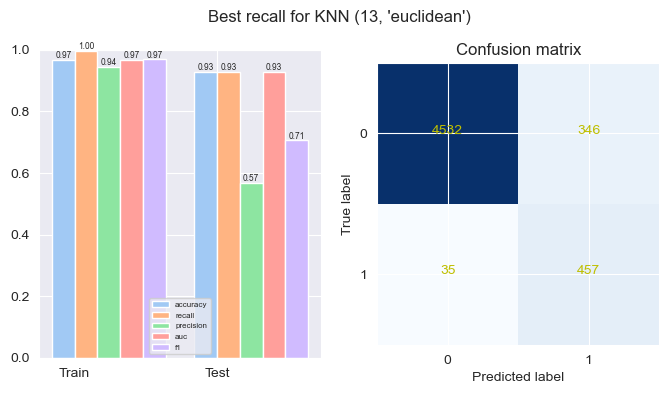

In [131]:
prd_trn_KNN_over = best_model_KNN_over.predict(trnX_over)
prd_tst_KNN_over = best_model_KNN_over.predict(tstX_over)

labels = [0,1]
plot_evaluation_results(params_KNN_over, trnY_over, prd_trn_KNN_over, tstY_over, prd_tst_KNN_over, labels)
savefig(f"Plots/pulsar_knn_{params_KNN_over['name']}_best_{params_KNN_over['metric']}_eval_over.png")

### SMOTE

In [133]:
from imblearn.over_sampling import SMOTE

In [134]:
RANDOM_STATE = 42

SM = SMOTE(sampling_strategy="minority", random_state=RANDOM_STATE)
smote_X, smote_y = SM.fit_resample(trnX_zscore, trnY_zscore)
df_smote = concat([DataFrame(smote_X), DataFrame(smote_y)], axis=1)
df_smote.columns = list(df.columns)
df_smote.to_csv("Datasets/pulsar_smote.csv", index=False)

smote_target_count = Series(smote_y).value_counts()
print("Minority class=", 1, ":", smote_target_count[1])
print("Majority class=", 0, ":", smote_target_count[0])
print("Proportion:",round(smote_target_count[1] / smote_target_count[0], 2),": 1")
print(df_smote.shape)

Minority class= 1 : 11381
Majority class= 0 : 11381
Proportion: 1.0 : 1
(22762, 9)


In [135]:
smote_X.shape

(22762, 8)

In [136]:
trnY_smote = df_smote['pulsar'].values
trnX_smote = df_smote.drop('pulsar', axis=1).values
tstY_smote = tstY_zscore
tstX_smote = tstX_zscore

#### NB

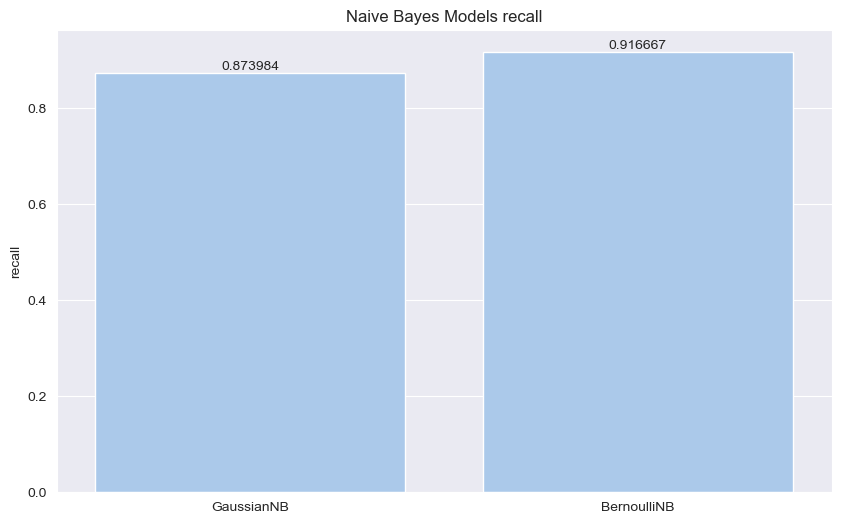

In [138]:
best_model_NB_smote, params_NB_smote = naive_Bayes_study(trnX_smote, trnY_smote, tstX_smote, tstY_smote, 'recall')

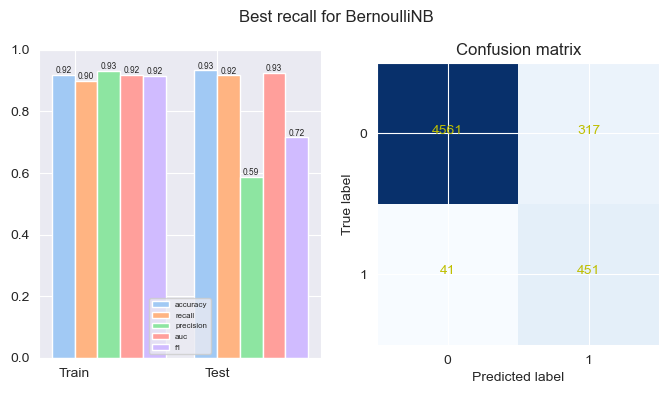

In [139]:
prd_trn_NB_smote = best_model_NB_smote.predict(trnX_smote)
prd_tst_NB_smote = best_model_NB_smote.predict(tstX_smote)

labels = [0,1]
plot_evaluation_results(params_NB_smote, trnY_smote, prd_trn_NB_smote, tstY_smote, prd_tst_NB_smote, labels)
savefig(f"Plots/pulsar_{params_NB_smote['name']}_best_{params_NB_smote['metric']}_eval_smote.png")

#### KNN

KNN best with k=11 and chebyshev


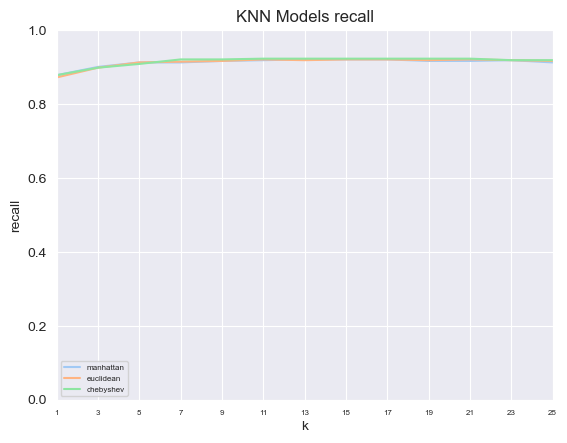

In [141]:
best_model_KNN_smote, params_KNN_smote = knn_study(trnX_smote, trnY_smote, tstX_smote, tstY_smote, 25, 2,'recall')

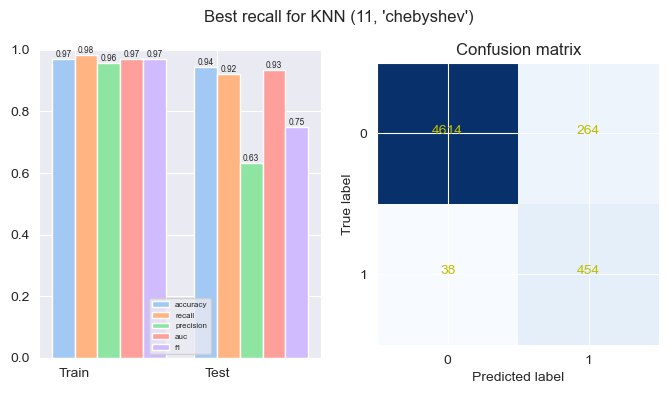

In [142]:
prd_trn_KNN_smote = best_model_KNN_smote.predict(trnX_smote)
prd_tst_KNN_smote = best_model_KNN_smote.predict(tstX_smote)

labels = [0,1]
plot_evaluation_results(params_KNN_smote, trnY_smote, prd_trn_KNN_smote, tstY_smote, prd_tst_KNN_smote, labels)
savefig(f"Plots/pulsar_knn_{params_KNN_smote['name']}_best_{params_KNN_smote['metric']}_eval_smote.png")

## Dataset choice

MinMax + SMOTEKNN Dataset

## Feature Selection Task

### Dropping Low Variance Variables 

In [147]:
df_smote.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Mean_IP,22762.0,-0.939415,1.498431,-4.103640,-2.145472,-0.582393,0.267973,3.178564
Std_IP,22762.0,-0.513224,1.201065,-3.164011,-1.454396,-0.439770,0.358473,7.632529
Exc_Kurtosis_IP,22762.0,1.095251,1.839346,-2.212262,-0.276093,0.130265,2.210644,7.134956
Skewness_IP,22762.0,0.971565,1.980703,-0.577548,-0.273889,-0.081957,1.487283,10.754560
Mean_DMSNR,22762.0,0.537408,1.383472,-0.420778,-0.343952,-0.197478,0.835315,7.151778
Std_DMSNR,22762.0,0.678185,1.248183,-0.973603,-0.479319,0.303256,1.806600,4.279852
Exc_Kurtosis_DMSNR,22762.0,-0.545504,1.056247,-2.539483,-1.458114,-0.690566,0.189004,5.822567
Skewness_DMSNR,22762.0,-0.366536,0.883007,-1.002921,-0.965848,-0.725019,-0.060850,10.197420
pulsar,22762.0,0.500000,0.500011,0.000000,0.000000,0.500000,1.000000,1.000000


In [148]:
def select_low_variance_variables(data, max_threshold, target):
    summary5 = data.describe()
    vars2drop = summary5.columns[summary5.loc["std"] * summary5.loc["std"] < max_threshold]
    vars2drop = vars2drop.drop(target) if target in vars2drop else vars2drop
    return list(vars2drop.values)

In [149]:
target_class = 'pulsar'
print("Original variables:", df_smote.columns.to_list())
print("Length:", len(df_smote.columns.to_list()))
drop = select_low_variance_variables(df_smote, 1.5,target_class)
print('\n')
print("="*130)
print('\n')
print("Variables to drop:", drop)
print("Length:", len(drop))

Original variables: ['Mean_IP', 'Std_IP', 'Exc_Kurtosis_IP', 'Skewness_IP', 'Mean_DMSNR', 'Std_DMSNR', 'Exc_Kurtosis_DMSNR', 'Skewness_DMSNR', 'pulsar']
Length: 9




Variables to drop: ['Std_IP', 'Exc_Kurtosis_DMSNR', 'Skewness_DMSNR']
Length: 3


In [150]:
from math import ceil

In [151]:
def study_variance_for_feature_selection(train,test,target,max_threshold,lag,metric):
    options = [round(i * lag, 3) for i in range(1, ceil(max_threshold / lag + lag))]
    results: dict[str, list] = {"NB": [], "KNN": []}
    summary5: DataFrame = train.describe()
    for thresh in options:
        vars2drop: Index[str] = summary5.columns[summary5.loc["std"] * summary5.loc["std"] < thresh]
        vars2drop = vars2drop.drop(target) if target in vars2drop else vars2drop

        train_copy: DataFrame = train.drop(vars2drop, axis=1, inplace=False)
        test_copy: DataFrame = test.drop(vars2drop, axis=1, inplace=False)
        eval: dict[str, list] | None = evaluate_approach(train_copy, test_copy, target=target, metric=metric)
        if eval is not None:
            results["NB"].append(eval[metric][0])
            results["KNN"].append(eval[metric][1])

    plot_multiline_chart(options,results,title=f"variance study ({metric})",xlabel="variance threshold",ylabel=metric,percentage=True)
    savefig(f"Plots/fs_low_var_{metric}_study.png")
    return results

In [152]:
trainX_smote = pd.DataFrame(data=trnX_smote,columns=df.drop('pulsar',axis=1).columns)
trainY_smote = pd.DataFrame(data=trnY_smote, columns = ['pulsar'])
train_smote = pd.concat([trainX_smote, trainY_smote], axis=1)
train_smote.to_csv("Datasets/SMOTE_train.csv")

In [153]:
testX_smote = pd.DataFrame(data=tstX_smote,columns=df.drop('pulsar',axis=1).columns)
testY_smote = pd.DataFrame(data=tstY_smote, columns = ['pulsar'])
test_smote = pd.concat([testX_smote, testY_smote], axis=1)
test_smote.to_csv("Datasets/SMOTE_test.csv")

{'NB': [0.9166666666666666,
  0.9227642276422764,
  0.926829268292683,
  0.9369918699186992,
  0.8434959349593496,
  0.8434959349593496],
 'KNN': [0.9207317073170732,
  0.9186991869918699,
  0.9207317073170732,
  0.9044715447154471,
  0.8902439024390244,
  0.8902439024390244]}

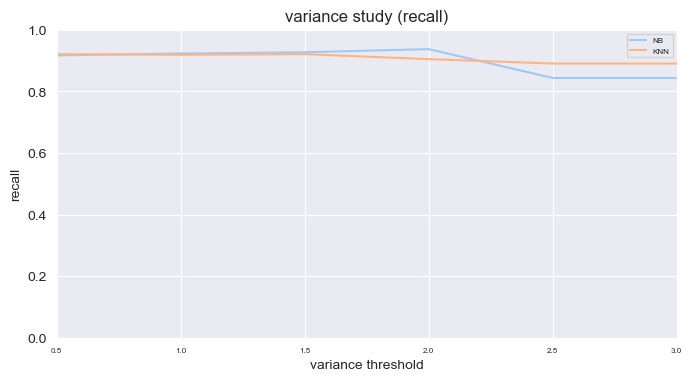

In [154]:
eval_metric = "recall"
target = 'pulsar'

plt.figure(figsize=(2 * HEIGHT, HEIGHT))
study_variance_for_feature_selection(train_smote,test_smote,target=target,max_threshold=3,lag=0.5,metric=eval_metric)

### Dropping Redundant Variables

In [156]:
df_smote.columns

Index(['Mean_IP', 'Std_IP', 'Exc_Kurtosis_IP', 'Skewness_IP', 'Mean_DMSNR',
       'Std_DMSNR', 'Exc_Kurtosis_DMSNR', 'Skewness_DMSNR', 'pulsar'],
      dtype='object')

In [157]:
print("Original variables:", df_smote.columns.values)
print("Length:", len(df_smote.columns.to_list()))
vars2drop = select_redundant_variables(df_smote,0.9,target_class)
print('\n')
print("="*130)
print('\n')
print("Variables to drop:", vars2drop)
print('Length:', len(vars2drop))

Original variables: ['Mean_IP' 'Std_IP' 'Exc_Kurtosis_IP' 'Skewness_IP' 'Mean_DMSNR'
 'Std_DMSNR' 'Exc_Kurtosis_DMSNR' 'Skewness_DMSNR' 'pulsar']
Length: 9




Variables to drop: ['Mean_IP', 'Skewness_IP']
Length: 2


In [158]:
def study_redundancy_for_feature_selection(train,test,target,min_threshold,lag,metric = "recall"):
    options = [round(min_threshold + i * lag, 3)
        for i in range(ceil((1 - min_threshold) / lag) + 1)]

    df: DataFrame = train.drop(target, axis=1, inplace=False)
    corr_matrix: DataFrame = abs(df.corr())
    variables: Index[str] = corr_matrix.columns
    results: dict[str, list] = {"NB": [], "KNN": []}
    for thresh in options:
        vars2drop: list = []
        for v1 in variables:
            vars_corr: Series = (corr_matrix[v1]).loc[corr_matrix[v1] >= thresh]
            vars_corr.drop(v1, inplace=True)
            if len(vars_corr) > 1:
                lst_corr = list(vars_corr.index)
                for v2 in lst_corr:
                    if v2 not in vars2drop:
                        vars2drop.append(v2)

        train_copy: DataFrame = train.drop(vars2drop, axis=1, inplace=False)
        test_copy: DataFrame = test.drop(vars2drop, axis=1, inplace=False)
        eval: dict | None = evaluate_approach(
            train_copy, test_copy, target=target, metric=metric
        )
        if eval is not None:
            results["NB"].append(eval[metric][0])
            results["KNN"].append(eval[metric][1])

    plot_multiline_chart(
        options,
        results,
        title=f"redundancy study ({metric})",
        xlabel="correlation threshold",
        ylabel=metric,
        percentage=True)
    savefig(f"Plots/pulsar_redundancy_{metric}_study.png")
    return results


{'NB': [0.8313008130081301,
  0.9126016260162602,
  0.8963414634146342,
  0.9186991869918699,
  0.9166666666666666,
  0.9166666666666666],
 'KNN': [0.6808943089430894,
  0.8292682926829268,
  0.9166666666666666,
  0.9247967479674797,
  0.9207317073170732,
  0.9207317073170732]}

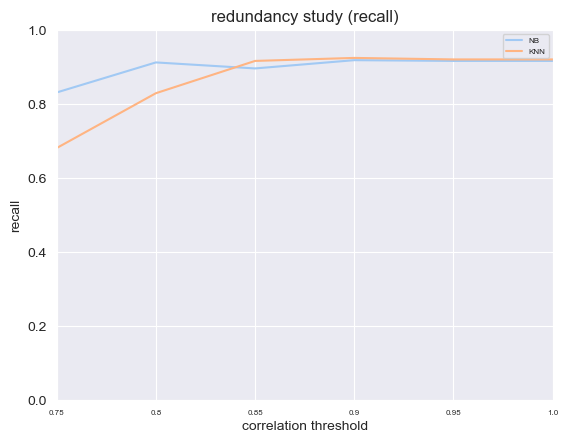

In [159]:
study_redundancy_for_feature_selection(train_smote,test_smote,target,0.75,0.05,eval_metric)

# Classification

In [161]:
trnX_cp = trnX_smote
tstX_cp = tstX_smote

trnY_cp =  trnY_smote
tstY_cp = tstY_smote

In [162]:
eval_metric = 'recall'

### Analogistas - KNN

KNN best with k=11 and chebyshev


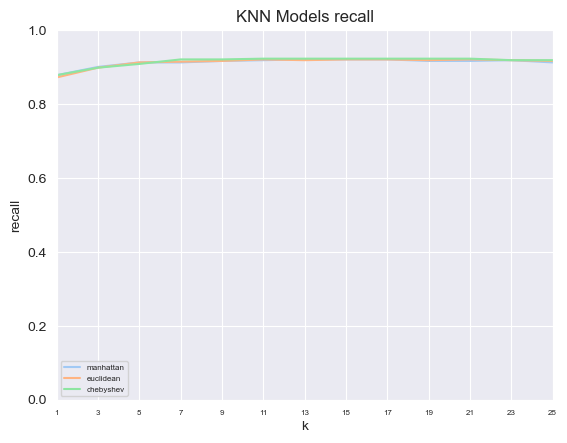

In [164]:
best_model_KNN_cp, params_KNN_cp = knn_study(trnX_cp, trnY_cp, tstX_cp, tstY_cp, k_max=25, lag=2, metric=eval_metric)
savefig(f"Plots/Classification_knn_{eval_metric}_study.png")

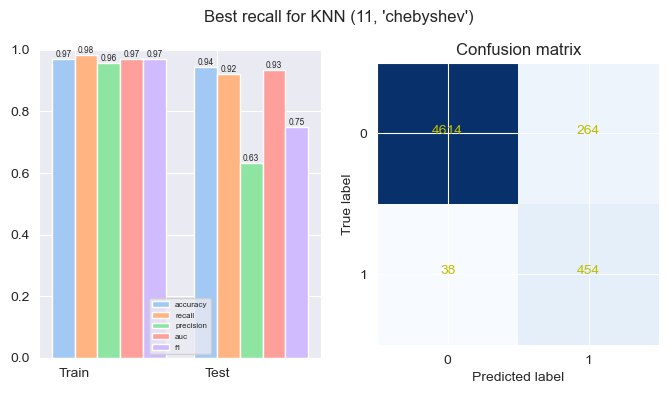

In [165]:
prd_trn_cp = best_model_KNN_cp.predict(trnX_cp)
prd_tst_cp = best_model_KNN_cp.predict(tstX_cp)

plot_evaluation_results(params_KNN_cp, trnY_cp, prd_trn_cp, tstY_cp, prd_tst_cp, labels)

savefig(f'Plots/Classification_knn_{params_KNN_cp["name"]}_best_{params_KNN_cp["metric"]}_eval.png')

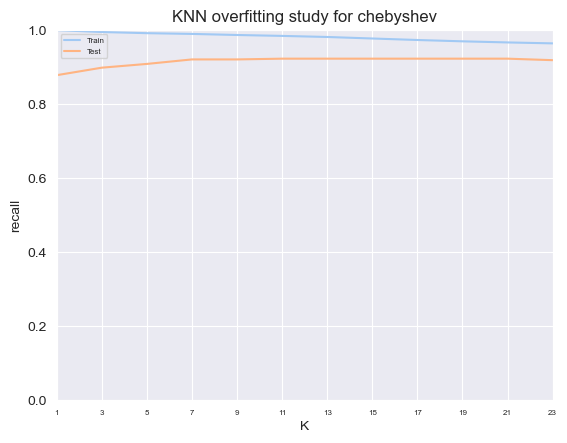

In [166]:
distance = params_KNN_cp["params"][1]
K_MAX = 25
kvalues: list[int] = [i for i in range(1, K_MAX, 2)]
y_tst_values = []
y_trn_values = []
acc_metric = "recall"

for k in kvalues:
    clf = KNeighborsClassifier(n_neighbors=k, metric=distance)
    clf.fit(trnX_cp, trnY_cp)
    prd_tst_Y = clf.predict(tstX_cp)
    prd_trn_Y = clf.predict(trnX_cp)
    y_tst_values.append(CLASS_EVAL_METRICS[acc_metric](tstY_cp, prd_tst_Y))
    y_trn_values.append(CLASS_EVAL_METRICS[acc_metric](trnY_cp, prd_trn_Y))

plot_multiline_chart(kvalues, {"Train": y_trn_values, "Test": y_tst_values}, title=f"KNN overfitting study for {distance}", xlabel="K",
    ylabel=str(acc_metric),percentage=True)

savefig("Plots/Classification_knn_overfitting.png")

## Bayesianos

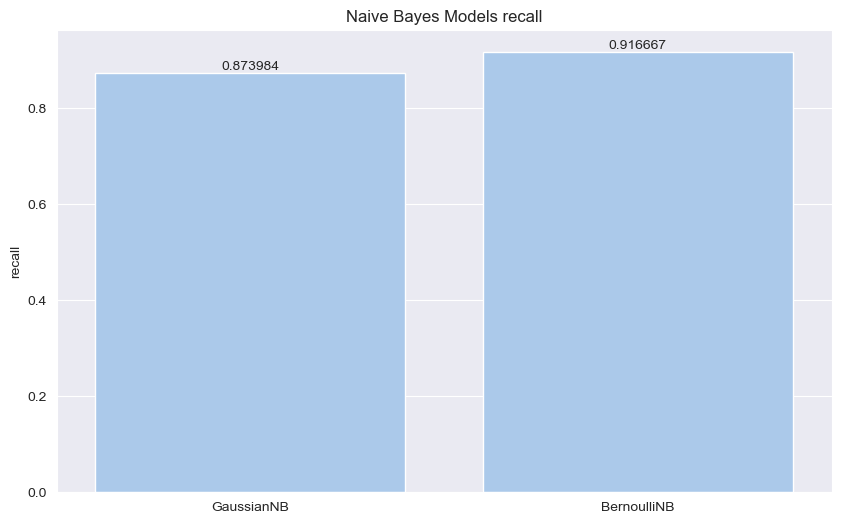

In [168]:
best_model_NB, params_NB = naive_Bayes_study(trnX_cp, trnY_cp, tstX_cp, tstY_cp, 'recall')
savefig(f"Plots/Classification_nb_{eval_metric}_study.png")

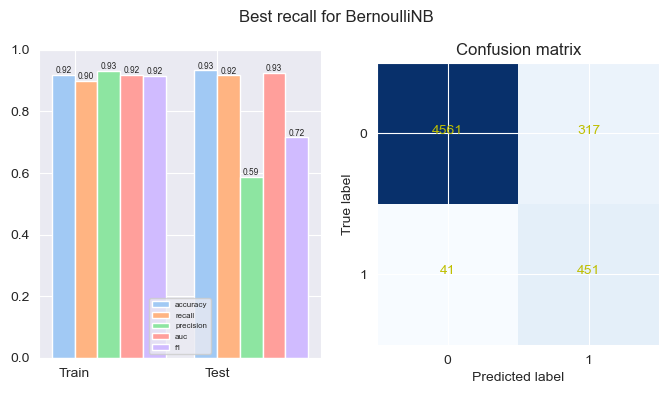

In [169]:
prd_trn_NB = best_model_NB.predict(trnX_cp)
prd_tst_NB = best_model_NB.predict(tstX_cp)

plot_evaluation_results(params_NB, trnY_cp, prd_trn_NB, tstY_cp, prd_tst_NB, labels)
savefig(f'Plots/Classification_{params_NB["name"]}_best_{params_NB["metric"]}_eval.png')

## Simbologistas

### Árvores de Decisão

In [172]:
from sklearn.tree import DecisionTreeClassifier

In [173]:
def trees_study(trnX, trnY, tstX, tstY, d_max, lag, metric):
    criteria = ['entropy', 'gini']
    depths = [i for i in range(2, d_max+1, lag)]

    best_model: DecisionTreeClassifier | None = None
    best_params: dict = {'name': 'DT', 'metric': metric, 'params': ()}
    best_performance: float = 0.0

    values: dict = {}
    for c in criteria:
        y_tst_values: list[float] = []
        for d in depths:
            clf = DecisionTreeClassifier(max_depth=d, criterion=c, min_impurity_decrease=0)
            clf.fit(trnX, trnY)
            prdY: array = clf.predict(tstX)
            eval: float = CLASS_EVAL_METRICS[metric](tstY, prdY)
            y_tst_values.append(eval)
            if eval - best_performance > DELTA_IMPROVE:
                best_performance = eval
                best_params['params'] = (c, d)
                best_model = clf
            # print(f'DT {c} and d={d}')
        values[c] = y_tst_values
    print(f"DT best with {best_params['params'][0]} and d={best_params['params'][1]}")
    plot_multiline_chart(depths, values, title=f'DT Models ({metric})', xlabel='d', ylabel=metric, percentage=True)

    return best_model, best_params

DT best with entropy and d=3


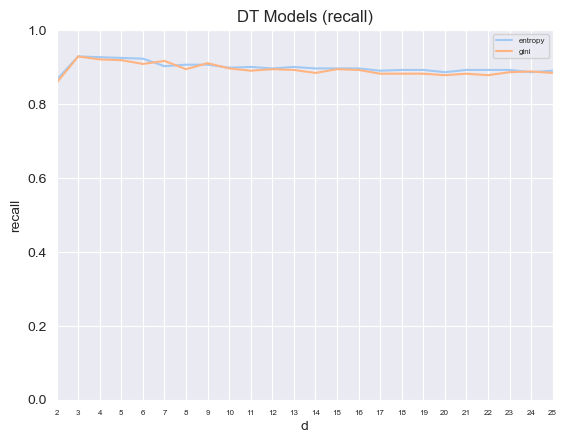

In [174]:
best_model_trees, params_trees = trees_study(trnX_cp, trnY_cp, tstX_cp, tstY_cp, d_max=25, lag=1, metric=eval_metric)
savefig(f'Plots/Classification_dt_{eval_metric}_study.png')

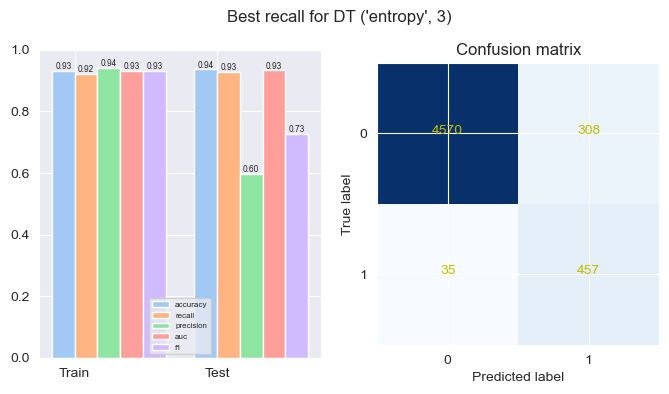

In [175]:
prd_trn_trees = best_model_trees.predict(trnX_cp)
prd_tst_trees = best_model_trees.predict(tstX_cp)
plot_evaluation_results(params_trees, trnY_cp, prd_trn_trees, tstY_cp, prd_tst_trees, labels)
savefig(f'Plots/Classification_dt_{params_trees["name"]}_best_{params_trees["metric"]}_eval.png')

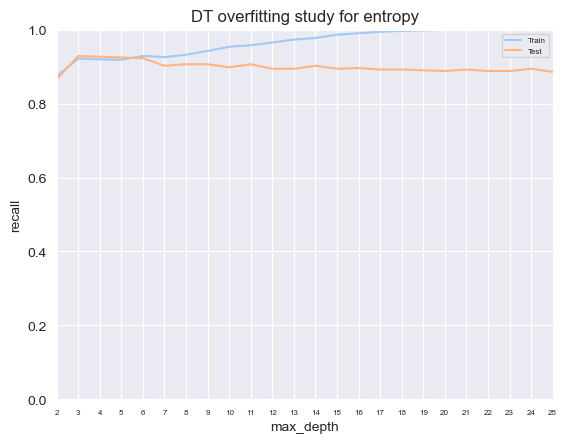

In [176]:
crit = params_trees["params"][0]
d_max = 25
depths: list[int] = [i for i in range(2, d_max + 1, 1)]
y_tst_values: list[float] = []
y_trn_values: list[float] = []
acc_metric = "recall"
for d in depths:
    clf = DecisionTreeClassifier(max_depth=d, criterion=crit, min_impurity_decrease=0)
    clf.fit(trnX_cp, trnY_cp)
    prd_tst_Y_tree: array = clf.predict(tstX_cp)
    prd_trn_Y_tree: array = clf.predict(trnX_cp)
    y_tst_values.append(CLASS_EVAL_METRICS[acc_metric](tstY_cp, prd_tst_Y_tree))
    y_trn_values.append(CLASS_EVAL_METRICS[acc_metric](trnY_cp, prd_trn_Y_tree))

plot_multiline_chart(depths,{"Train": y_trn_values, "Test": y_tst_values},title=f"DT overfitting study for {crit}",
    xlabel="max_depth",ylabel=str(eval_metric),percentage=True)
savefig(f"Plots/Classification_dt_{eval_metric}_overfitting.png")

(-0.5, 9266.5, 3107.5, -0.5)

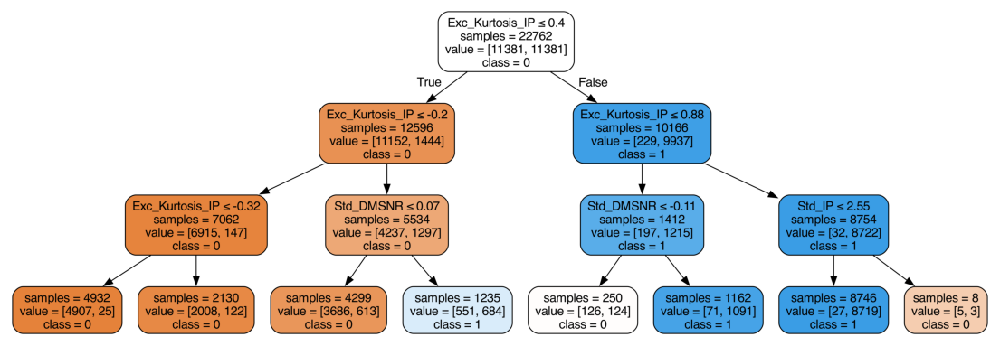

In [749]:
from sklearn.tree import export_graphviz
from matplotlib.pyplot import imread, imshow, axis
from subprocess import call

tree_filename: str = f"Plots/Dt_{eval_metric}_best_tree"
max_depth2show = 3
st_labels: list[str] = [str(value) for value in labels]

dot_data: str = export_graphviz(
    best_model_trees,
    out_file=tree_filename,
    max_depth=max_depth2show,
    feature_names=vars,
    class_names=st_labels,
    filled=True,
    rounded=True,
    impurity=False,
    special_characters=True,
    precision=2,)

# Convert to png
call(["dot", "-Tpng", tree_filename + ".dot", "-o", tree_filename + ".png", "-Gdpi=600"])

plt.figure(figsize=(14, 6))
imshow(imread(tree_filename + ".png"))
axis("off")


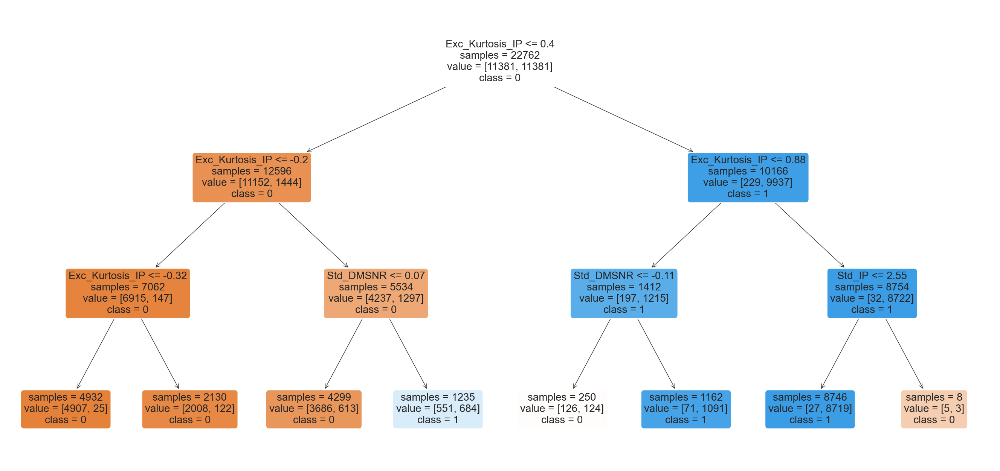

In [177]:
from sklearn.tree import plot_tree
vars = test_smote.drop('pulsar',axis=1).columns.to_list()
max_depth2show = 3
st_labels: list[str] = [str(value) for value in labels]
plt.figure(figsize=(34, 16))
plot_tree(best_model_trees,max_depth=max_depth2show,feature_names=vars,class_names=st_labels,filled=True,rounded=True,
          impurity=False,precision=2,fontsize=20)
savefig(f"Plots/Classification_tree")

1. Exc_Kurtosis_IP (0.9532823619086891)
2. Std_DMSNR (0.04477159256180883)
3. Std_IP (0.001946045529501997)
4. Skewness_DMSNR (0.0)
5. Exc_Kurtosis_DMSNR (0.0)
6. Mean_DMSNR (0.0)
7. Skewness_IP (0.0)
8. Mean_IP (0.0)


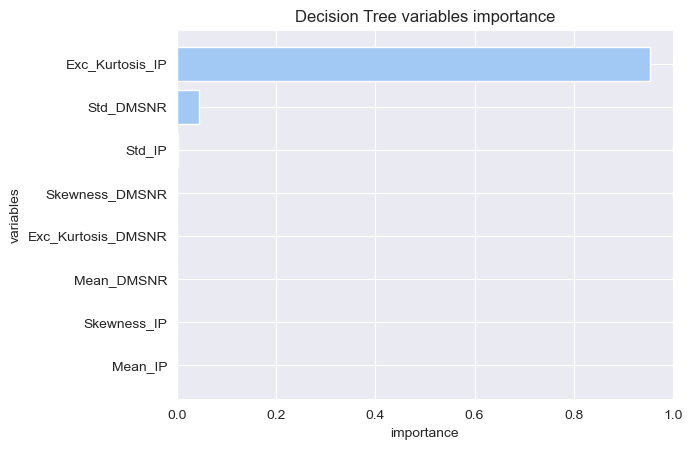

In [178]:
from numpy import argsort
importances = best_model_trees.feature_importances_
indices: list[int] = argsort(importances)[::-1]
elems: list[str] = []
imp_values: list[float] = []
for f in range(len(vars)):
    elems += [vars[indices[f]]]
    imp_values += [importances[indices[f]]]
    print(f"{f+1}. {elems[f]} ({importances[indices[f]]})")

plot_horizontal_bar_chart(elems,imp_values,title="Decision Tree variables importance",xlabel="importance",ylabel="variables",percentage=True)
savefig(f"Plots/Classification_dt_{eval_metric}_vars_ranking.png",bbox_inches = 'tight')

### Random Forests

In [180]:
from sklearn.ensemble import RandomForestClassifier

In [721]:
def random_forests_study(trnX: ndarray,trnY: array,tstX: ndarray,tstY: array,nr_max_trees: int = 2500,lag: int = 500,metric: str = "accuracy"): 

    n_estimators: list[int] = [100] + [i for i in range(100, nr_max_trees + 1, lag)]
    max_depths: list[int] = [2, 3, 5]
    max_features: list[float] = [0.1, 0.3, 0.5, 0.7, 0.9]

    best_model: RandomForestClassifier | None = None
    best_params: dict = {"name": "RF", "metric": metric, "params": ()}
    best_performance: float = 0.0

    values: dict = {}

    cols: int = len(max_depths)
    _, axs = subplots(1, cols, figsize=(cols * HEIGHT, HEIGHT), squeeze=False)
    for i in range(len(max_depths)):
        d: int = max_depths[i]
        values = {}
        for f in max_features:
            y_tst_values: list[float] = []
            for n in n_estimators:
                clf = RandomForestClassifier(n_estimators=n, max_depth=d, max_features=f)
                clf.fit(trnX, trnY)
                prdY: array = clf.predict(tstX)
                eval: float = CLASS_EVAL_METRICS[metric](tstY, prdY)
                y_tst_values.append(eval)
                if eval - best_performance > DELTA_IMPROVE:
                    best_performance = eval
                    best_params["params"] = (d, f, n)
                    best_model = clf
                # print(f'RF d={d} f={f} n={n}')
            values[f] = y_tst_values
        plot_multiline_chart(n_estimators,values,ax=axs[0, i],title=f"Random Forests with max_depth={d}",xlabel="nr estimators",
            ylabel=metric,percentage=True)
    print(f'RF best for {best_params["params"][2]} trees (d={best_params["params"][0]} and f={best_params["params"][1]})')
    
    return best_model, best_params

RF best for 100 trees (d=5 and f=0.7)


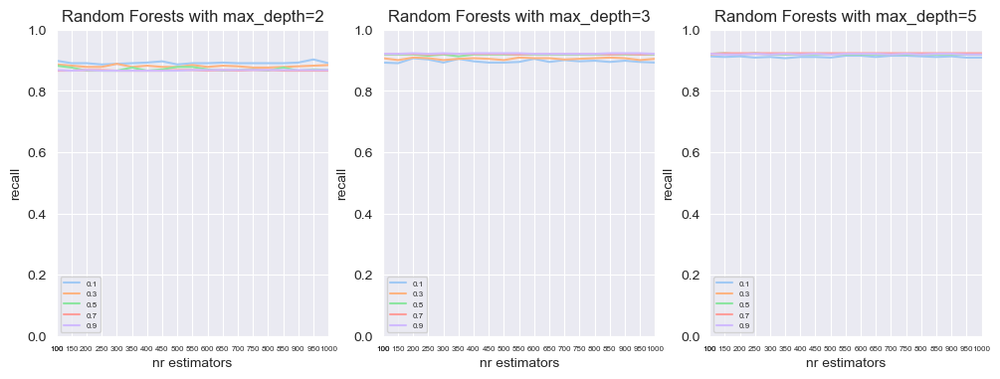

In [723]:
best_model_forest, params_forest = random_forests_study(trnX_cp, trnY_cp, tstX_cp, tstY_cp,nr_max_trees=1000,lag=50,metric=eval_metric)
savefig(f"Plots/Classification_rf_{eval_metric}_study.png")

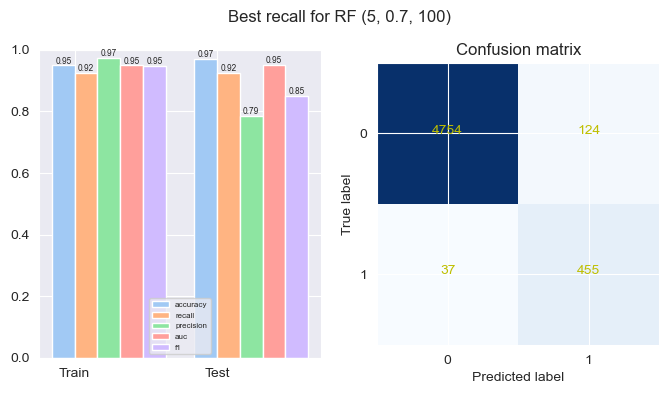

In [724]:
prd_trn_forest = best_model_forest.predict(trnX_cp)
prd_tst_forest = best_model_forest.predict(tstX_cp)

plot_evaluation_results(params_forest, trnY_cp, prd_trn_forest, tstY_cp, prd_tst_forest, labels)
savefig(f'Plots/Classification_rf_{params_forest["name"]}_best_{params_forest["metric"]}_eval.png')

1. Exc_Kurtosis_IP (0.5617862576674998)
2. Skewness_IP (0.172423360626366)
3. Mean_IP (0.15549314510148796)
4. Std_DMSNR (0.06548401727923928)
5. Mean_DMSNR (0.02267403896186982)
6. Std_IP (0.008318289972727481)
7. Skewness_DMSNR (0.007482305407234767)
8. Exc_Kurtosis_DMSNR (0.006338584983574914)


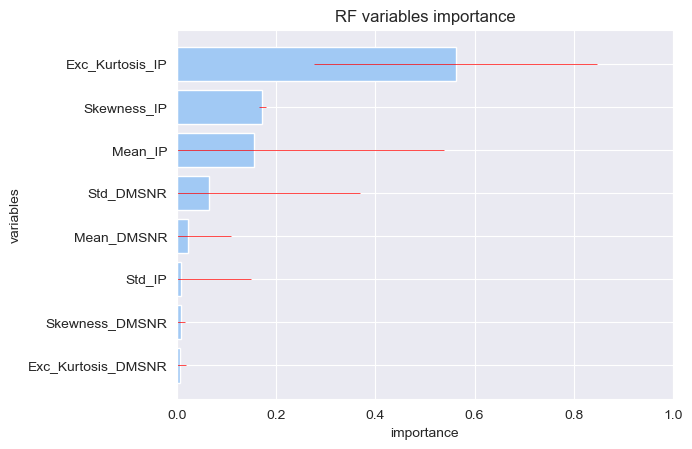

In [443]:
from numpy import std, argsort
vars = test_smote.drop('pulsar',axis=1).columns.to_list()
stdevs = list(std([tree.feature_importances_ for tree in best_model_forest.estimators_], axis=0))
importances = best_model_forest.feature_importances_
indices = argsort(importances)[::-1]
elems = []
imp_values = []
for f in range(len(vars)):
    elems += [vars[indices[f]]]
    imp_values.append(importances[indices[f]])
    print(f"{f+1}. {elems[f]} ({importances[indices[f]]})")

plot_horizontal_bar_chart(elems,imp_values,error=stdevs,title="RF variables importance",xlabel="importance",ylabel="variables",percentage=True)
savefig(f"Plots/Classification_rf_{eval_metric}_vars_ranking.png",bbox_inches = 'tight')

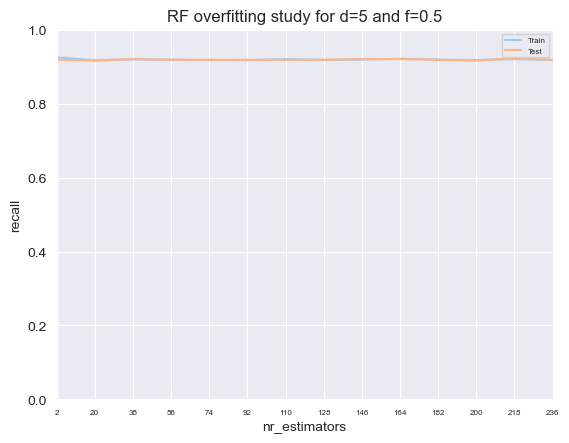

In [478]:
d_max: int = params_forest["params"][0]
feat: float = params_forest["params"][1]
nr_estimators: list[int] = [i for i in range(2, 240, 18)]

y_tst_values: list[float] = []
y_trn_values: list[float] = []
acc_metric: str = "recall"

for n in nr_estimators:
    clf = RandomForestClassifier(n_estimators=n, max_depth=d_max, max_features=feat)
    clf.fit(trnX_cp, trnY_cp)
    prd_tst_Y_forest = clf.predict(tstX_cp)
    prd_trn_Y_forest = clf.predict(trnX_cp)
    y_tst_values.append(CLASS_EVAL_METRICS[acc_metric](tstY_cp, prd_tst_Y_forest))
    y_trn_values.append(CLASS_EVAL_METRICS[acc_metric](trnY_cp, prd_trn_Y_forest))


plot_multiline_chart(nr_estimators,{"Train": y_trn_values, "Test": y_tst_values},title=f"RF overfitting study for d={d_max} and f={feat}",
    xlabel="nr_estimators",ylabel=str(eval_metric),percentage=True)

savefig(f"Plots/Classification_rf_{eval_metric}_overfitting.png")

### Gradient Boosting

In [187]:
from sklearn.ensemble import GradientBoostingClassifier

In [661]:
def gradient_boosting_study(trnX: ndarray,trnY: array,tstX: ndarray,tstY: array,nr_max_trees: int = 2500,lag: int = 500,metric: str = "recall") -> tuple[GradientBoostingClassifier | None, dict]:
    n_estimators = [1] + [i for i in range(1, nr_max_trees + 1, lag)]
    max_depths = [2, 3, 4]
    learning_rates = [0.1, 0.3, 0.5, 0.7, 0.9]

    best_model: GradientBoostingClassifier | None = None
    best_params: dict = {"name": "GB", "metric": metric, "params": ()}
    best_performance: float = 0.0

    values: dict = {}
    cols: int = len(max_depths)
    _, axs = subplots(1, cols, figsize=(cols * HEIGHT, HEIGHT), squeeze=False)
    for i in range(len(max_depths)):
        d: int = max_depths[i]
        values = {}
        for lr in learning_rates:
            y_tst_values: list[float] = []
            for n in n_estimators:
                clf = GradientBoostingClassifier(n_estimators=n, max_depth=d, learning_rate=lr)
                clf.fit(trnX, trnY)
                prdY: array = clf.predict(tstX)
                eval: float = CLASS_EVAL_METRICS[metric](tstY, prdY)
                y_tst_values.append(eval)
                if eval - best_performance > DELTA_IMPROVE:
                    best_performance = eval
                    best_params["params"] = (d, lr, n)
                    best_model = clf
                # print(f'GB d={d} lr={lr} n={n}')
            values[lr] = y_tst_values
        plot_multiline_chart(
            n_estimators,
            values,
            ax=axs[0, i],
            title=f"Gradient Boosting with max_depth={d}",
            xlabel="nr estimators",
            ylabel=metric,
            percentage=True)
    print(f'GB best for {best_params["params"][2]} trees (d={best_params["params"][0]} and lr={best_params["params"][1]}')

    return best_model, best_params

GB best for 2 trees (d=2 and lr=0.9


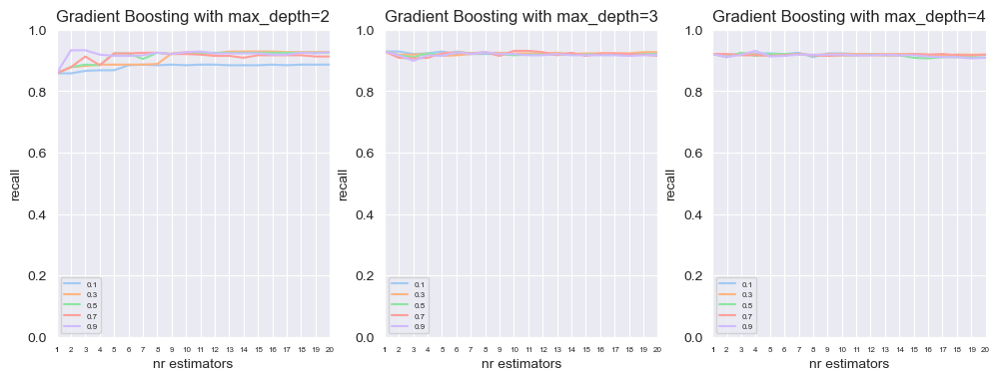

In [663]:
best_model_GB, params_GB = gradient_boosting_study(trnX_cp,trnY_cp,tstX_cp,tstY_cp,nr_max_trees=20,lag=1,metric='recall')
savefig(f"Plots/Classification_gb_{eval_metric}_study.png")

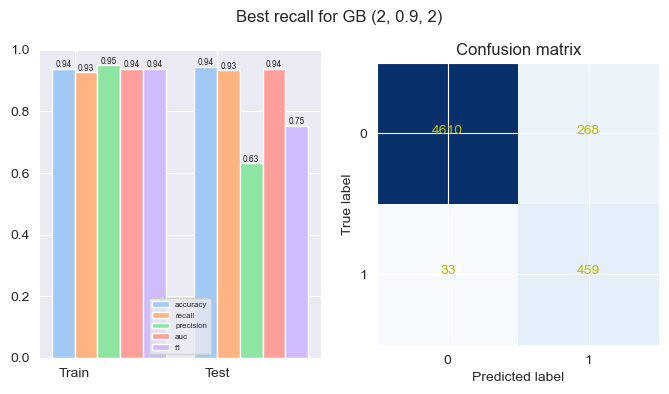

In [711]:
prd_trn_GB = best_model_GB.predict(trnX_cp)
prd_tst_GB = best_model_GB.predict(tstX_cp)

plot_evaluation_results(params_GB, trnY_cp, prd_trn_GB, tstY_cp, prd_tst_GB, labels)
savefig(f'Plots/Classification_gb_{params_GB["name"]}_best_{params_GB["metric"]}_eval.png')

1. Exc_Kurtosis_IP (0.9236013315345819)
2. Std_DMSNR (0.07639866846541803)
3. Skewness_DMSNR (0.0)
4. Exc_Kurtosis_DMSNR (0.0)
5. Mean_DMSNR (0.0)
6. Skewness_IP (0.0)
7. Std_IP (0.0)
8. Mean_IP (0.0)


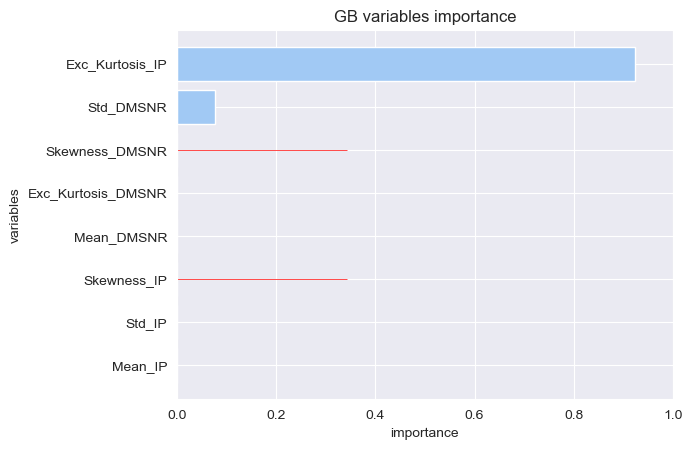

In [713]:
vars = test_smote.drop('pulsar',axis=1).columns.to_list()
trees_importances = []
for lst_trees in best_model_GB.estimators_:
    for tree in lst_trees:
        trees_importances.append(tree.feature_importances_)
        
stdevs: list[float] = list(std(trees_importances, axis=0))
importances = best_model_GB.feature_importances_
indices: list[int] = argsort(importances)[::-1]
elems: list[str] = []
imp_values: list[float] = []
for f in range(len(vars)):
    elems += [vars[indices[f]]]
    imp_values.append(importances[indices[f]])
    print(f"{f+1}. {elems[f]} ({importances[indices[f]]})")


plot_horizontal_bar_chart(elems,imp_values,error=stdevs,title="GB variables importance",xlabel="importance",ylabel="variables",percentage=True)
savefig(f"Plots/Classification_gb_{eval_metric}_vars_ranking.png",bbox_inches = 'tight')

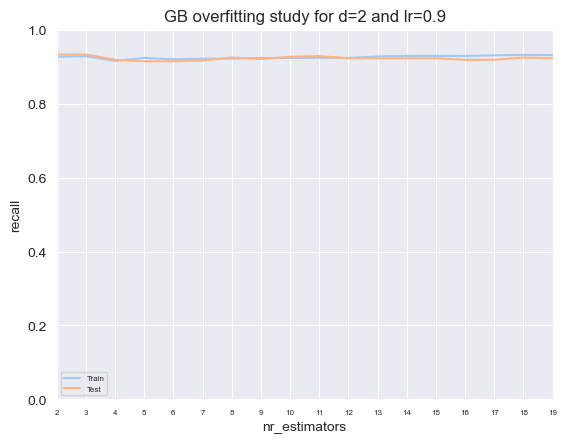

In [707]:
d_max: int = params_GB["params"][0]
lr: float = params_GB["params"][1]
nr_estimators: list[int] = [i for i in range(2, 20, 1)]

y_tst_values: list[float] = []
y_trn_values: list[float] = []
acc_metric: str = "recall"

for n in nr_estimators:
    clf = GradientBoostingClassifier(n_estimators=n, max_depth=d_max, learning_rate=lr)
    clf.fit(trnX_cp, trnY_cp)
    prd_tst_Y_GB: array = clf.predict(tstX_cp)
    prd_trn_Y_GB: array = clf.predict(trnX_cp)
    y_tst_values.append(CLASS_EVAL_METRICS[acc_metric](tstY_cp, prd_tst_Y_GB))
    y_trn_values.append(CLASS_EVAL_METRICS[acc_metric](trnY_cp, prd_trn_Y_GB))

plot_multiline_chart(nr_estimators,{"Train": y_trn_values, "Test": y_tst_values},title=f"GB overfitting study for d={d_max} and lr={lr}",
    xlabel="nr_estimators",ylabel=str(eval_metric),percentage=True)
savefig(f"Plots/Classification_gb_{eval_metric}_overfitting.png")

## Connectionists - MLP

In [691]:
from typing import Literal
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import log_loss
from sklearn.exceptions import ConvergenceWarning

In [693]:
ConvergenceWarning('ignore')

sklearn.exceptions.ConvergenceWarning('ignore')

In [697]:
def mlp_study(trnX: ndarray,trnY: array,tstX: ndarray,tstY: array,nr_max_iterations: int = 2500,lag: int = 500,metric: str = "recall",) -> tuple[MLPClassifier | None, dict]:
    nr_iterations: list[int] = [lag] + [i for i in range(lag, nr_max_iterations + 1, lag)]

    lr_types: list[Literal["constant", "invscaling", "adaptive"]] = ["constant","invscaling","adaptive",]  
    # only used if optimizer='sgd'
    learning_rates: list[float] = [0.5, 0.05, 0.005, 0.0005]

    best_model: MLPClassifier | None = None
    best_params: dict = {"name": "MLP", "metric": metric, "params": ()}
    best_performance: float = 0.0
    train_loss_values = {type: {lr: [] for lr in learning_rates} for type in lr_types}
    test_loss_values = {type: {lr: [] for lr in learning_rates} for type in lr_types}


    values: dict = {}
    _, axs = subplots(
        1, len(lr_types), figsize=(len(lr_types) * HEIGHT, HEIGHT), squeeze=False)
    for i in range(len(lr_types)):
        type: str = lr_types[i]
        values = {}
        for lr in learning_rates:
            warm_start: bool = False
            y_tst_values: list[float] = []
           
            for j in range(len(nr_iterations)):
                clf = MLPClassifier(learning_rate=type,learning_rate_init=lr,max_iter=lag,warm_start=warm_start,activation="logistic",
                    solver="sgd",verbose=False)
    
                clf.fit(trnX, trnY)
                
                prdY: array = clf.predict(tstX)
                eval: float = CLASS_EVAL_METRICS[metric](tstY, prdY)
                y_tst_values.append(eval)
                warm_start = True
          
                if eval - best_performance > DELTA_IMPROVE:
                    best_performance = eval
                    best_params["params"] = (type, lr, nr_iterations[j])
                    best_model = clf
                # print(f'MLP lr_type={type} lr={lr} n={nr_iterations[j]}')
            values[lr] = y_tst_values

        plot_multiline_chart(nr_iterations,values,ax=axs[0, i],title=f"MLP with {type}",xlabel="nr iterations",ylabel=metric,percentage=True)
    print(f'MLP best for {best_params["params"][2]} iterations (lr_type={best_params["params"][0]} and lr={best_params["params"][1]}')

    return best_model, best_params

/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_

MLP best for 2800 iterations (lr_type=constant and lr=0.05


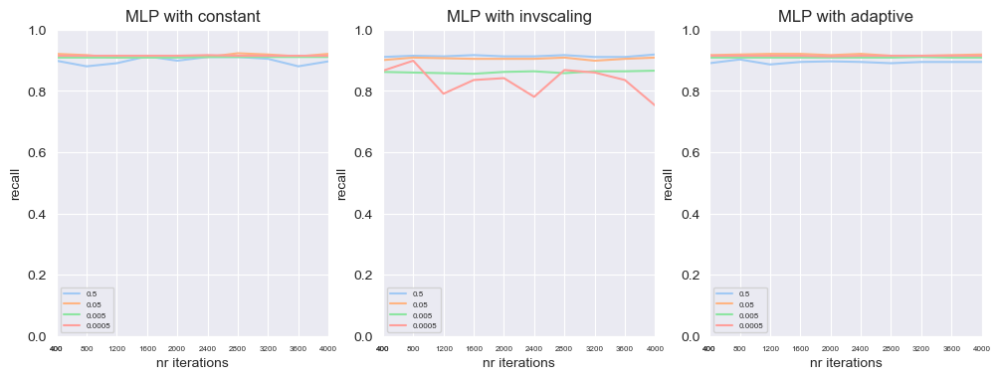

In [701]:
best_model_MLP, params_MLP = mlp_study(trnX_cp,trnY_cp,tstX_cp,tstY_cp,nr_max_iterations=4000,lag=400,metric='recall')
savefig(f"Plots/Classification_mlp_{eval_metric}_study.png")

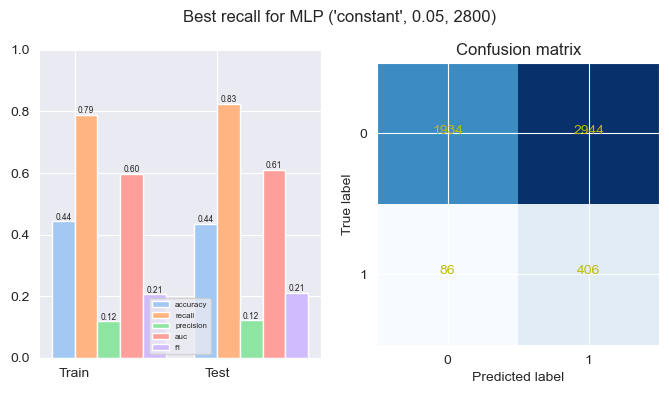

In [702]:
prd_trn_mlp = best_model_MLP.predict(trnX)
prd_tst_mlp = best_model_MLP.predict(tstX)

plot_evaluation_results(params_MLP, trnY, prd_trn_mlp, tstY, prd_tst_mlp, labels)
savefig(f'Plots/Classification_mlp_{params_MLP["name"]}_best_{params_MLP["metric"]}_eval.png')

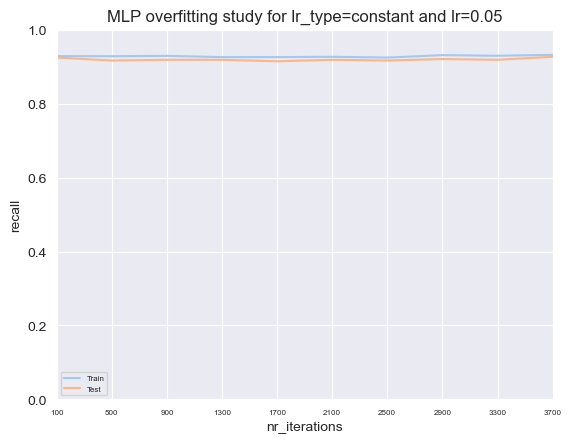

In [705]:
lr_type: Literal["constant", "invscaling", "adaptive"] = params_MLP["params"][0]
lr: float = params_MLP["params"][1]
nr_iterations: list[int] = [i for i in range(100, 4000, 400)]

y_tst_values: list[float] = []
y_trn_values: list[float] = []
acc_metric = "recall"

warm_start: bool = False
for n in nr_iterations:
    clf = MLPClassifier(warm_start=warm_start,learning_rate=lr_type,learning_rate_init=lr,max_iter=5000,activation="logistic",solver="sgd",verbose=False)
    clf.fit(trnX_cp, trnY_cp)
    prd_tst_Y_MLP = clf.predict(tstX_cp)
    prd_trn_Y_MLP = clf.predict(trnX_cp)
    y_tst_values.append(CLASS_EVAL_METRICS[acc_metric](tstY_cp, prd_tst_Y_MLP))
    y_trn_values.append(CLASS_EVAL_METRICS[acc_metric](trnY_cp, prd_trn_Y_MLP))
    warm_start = True

plot_multiline_chart(nr_iterations,{"Train": y_trn_values, "Test": y_tst_values},title=f"MLP overfitting study for lr_type={lr_type} and lr={lr}",
    xlabel="nr_iterations",ylabel=str(eval_metric),percentage=True)
savefig(f"Plots/Classification_mlp_{eval_metric}_overfitting.png")

https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html

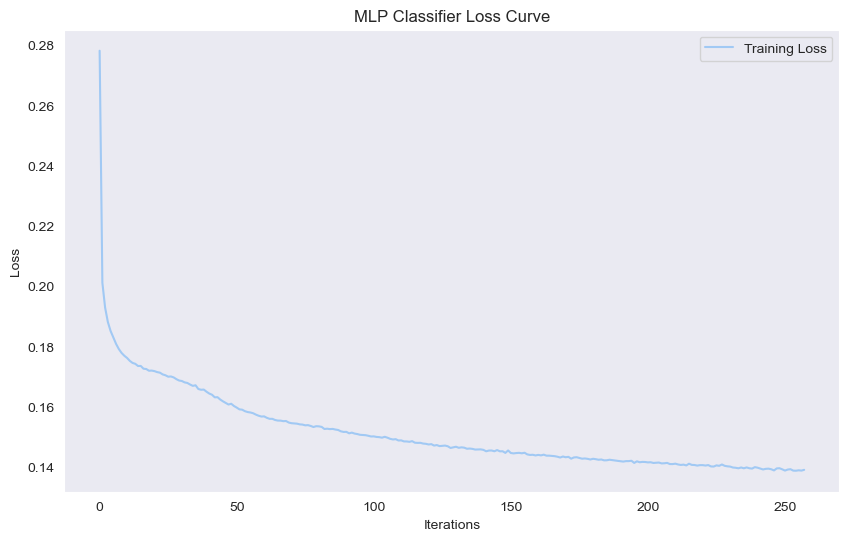

In [751]:
# Check if the best model has the `loss_curve_` attribute
if hasattr(best_model_MLP, 'loss_curve_'):
    loss_values = best_model_MLP.loss_curve_
    
    # Plot the loss curve
    plt.figure(figsize=(10, 6))
    plt.plot(loss_values, label='Training Loss')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.title('MLP Classifier Loss Curve')
    plt.legend()
    plt.grid()
    plt.savefig(f"Plots/Classification_mlp_{eval_metric}_loss_curve.png", bbox_inches='tight')
    plt.show()
else:
    print("The best model does not have a loss_curve_ attribute.")

MLP best for 4000 iterations (lr_type=constant and lr=0.05

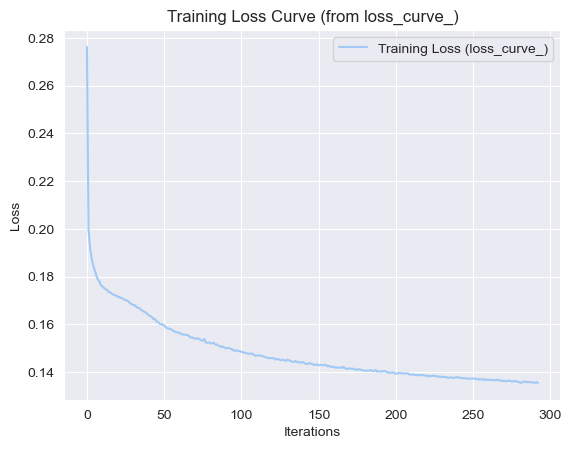

In [605]:
# Fit the model in a single call to capture the loss_curve_
mlp_loss_single = MLPClassifier(learning_rate=lr_type, learning_rate_init=lr, max_iter=4500, activation="logistic", solver="sgd", verbose=False)
mlp_loss_single.fit(trnX_cp, trnY_cp)

# Plot the loss curves from loss_curve_ attribute
plt.figure()
plt.plot(mlp_loss_single.loss_curve_, label='Training Loss (loss_curve_)')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.title('Training Loss Curve (from loss_curve_)')
plt.legend()
plt.show()